## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis, pearsonr
from statsmodels.graphics.gofplots import qqplot

## Reading in the Database and Extracting the Required Columns 

In [10]:
df = pd.read_csv('molecule_details_fin.csv')

In [11]:
df.head()

,Coconut_ID,InChI,InChIKey,SMILES,Sugar_Free_SMILES,Molecular_Formula,Molecular_Weight,Citation_DOI,Taxa_Text,Synonyms,...,Number_of_Nitrogens,Number_of_Oxygens,Total_Atom_Number,Bond_Count,Found_in_Databases,Murko_Framework,ALogP,APolarSurfaceArea,Topo_PSA,Clean_Energy
0,CNP0000002,InChI=1/C27H36N2O15S/c1-5-12(29-9-45)26(37)44-...,FJEMIESGEMWDOB-UHFFFAOYSA-N,CC=C(N=CS)C(=O)OC1C(COC(C)=O)OC(C2(O)CC(=O)C(N...,O=C(O)C=1C(=O)C(O)CC(=O)C1N,C27H36N2O15S,660.651,[],[notax],[],...,2,15,81,47,[chemspidernp],C1=CCCCC1,-2.08210,260.03,260.03,NaN
1,CNP0000003,InChI=1/C34H30O10/c1-14-10-16-24(21(11-14)42-4...,KLWKJVYCDFWQMK-UHFFFAOYSA-N,COc1cc(C)cc2c1C(=O)OC1C(O)C=CC3c4c(cc(OC)c5c4C...,O=C1OC2C(O)C=CC3C4=C5C(=O)C=6C(OC)=CC=C(OC)C6C...,C34H30O10,598.604,[],[notax],[],...,0,10,74,50,[chemspidernp],O1Cc2ccccc2CC34Cc5ccc6c(c5C4C=CCC13)Cc7ccccc7C6,3.63422,137.82,137.82,NaN
2,CNP0000004,InChI=1/C32H26O9/c1-13-9-16-24(20(10-13)39-2)3...,PTEKHLCNKCAXPH-UHFFFAOYSA-N,COc1cc(C)cc2c1C(=O)OC1C(O)C=CC3c4c(cc(OC)c5c4C...,O=C1OC2C(O)C=CC3C4=C5C(=O)C=6C=CC=C(O)C6C(=O)C...,C32H26O9,554.551,[],[notax],[],...,0,9,67,47,[chemspidernp],O1Cc2ccccc2CC34Cc5ccc6c(c5C4C=CCC13)Cc7ccccc7C6,3.32262,139.59,139.59,NaN
3,CNP0000005,"InChI=1/C33H42O6/c1-31(2,3)30(36)37-18-17-33(6...",ZVAVQCZAGOKAMX-UHFFFAOYSA-N,CC1(C)CC2C(OC(=O)c3ccccc3)C(OC(=O)c3ccccc3)CC(...,O=C(OC1CC(C)(CCOC(=O)C(C)(C)C)C2CC(C)(C)CC2C1O...,C33H42O6,534.693,[],[notax],[],...,0,6,81,42,[chemspidernp],O(Cc1ccccc1)C2CCC3CCCC3C2OCc4ccccc4,6.87940,78.90,78.90,NaN
4,CNP0000006,InChI=1/C31H24O9/c1-12-8-15-23(20(9-12)39-2)30...,UYIPOCQHTAYRMA-UHFFFAOYSA-N,COc1cc(C)cc2c1C(=O)OC1C(O)C=CC3c4c(cc(O)c5c4C(...,O=C1OC2C(O)C=CC3C4=C5C(=O)C=6C=CC=C(O)C6C(=O)C...,C31H24O9,540.524,[],[notax],[],...,0,9,64,46,[chemspidernp],O1Cc2ccccc2CC34Cc5ccc6c(c5C4C=CCC13)Cc7ccccc7C6,3.01962,150.59,150.59,NaN


In [12]:
data = df[['Coconut_ID', 'Molecular_Formula', 'Molecular_Weight', 'Number_of_Nitrogens', 'Number_of_Oxygens', 'Number_of_Carbons', 'Total_Atom_Number', 'Bond_Count', 'ALogP','APolarSurfaceArea', 'Topo_PSA' ]]

In [13]:
data.head()

,Coconut_ID,Molecular_Formula,Molecular_Weight,Number_of_Nitrogens,Number_of_Oxygens,Number_of_Carbons,Total_Atom_Number,Bond_Count,ALogP,APolarSurfaceArea,Topo_PSA
0,CNP0000002,C27H36N2O15S,660.651,2,15,27,81,47,-2.08210,260.03,260.03
1,CNP0000003,C34H30O10,598.604,0,10,34,74,50,3.63422,137.82,137.82
2,CNP0000004,C32H26O9,554.551,0,9,32,67,47,3.32262,139.59,139.59
3,CNP0000005,C33H42O6,534.693,0,6,33,81,42,6.87940,78.90,78.90
4,CNP0000006,C31H24O9,540.524,0,9,31,64,46,3.01962,150.59,150.59


## Understanding the Dataset 

In [14]:
print("Dataset Overview:")
print(data.info())

Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48492 entries, 0 to 48491
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Coconut_ID           48492 non-null  object 
 1   Molecular_Formula    48492 non-null  object 
 2   Molecular_Weight     48492 non-null  float64
 3   Number_of_Nitrogens  48492 non-null  int64  
 4   Number_of_Oxygens    48492 non-null  int64  
 5   Number_of_Carbons    48492 non-null  int64  
 6   Total_Atom_Number    48492 non-null  int64  
 7   Bond_Count           48492 non-null  int64  
 8   ALogP                48492 non-null  float64
 9   APolarSurfaceArea    48492 non-null  float64
 10  Topo_PSA             48492 non-null  float64
dtypes: float64(4), int64(5), object(2)
memory usage: 4.1+ MB
None


In [17]:
print("\nSummary Statistics:")
data.describe()


Summary Statistics:


,Molecular_Weight,Number_of_Nitrogens,Number_of_Oxygens,Number_of_Carbons,Total_Atom_Number,Bond_Count,ALogP,APolarSurfaceArea,Topo_PSA
count,48492.000000,48492.000000,48492.000000,48492.000000,48492.000000,48492.000000,48492.000000,48492.000000,48492.000000
mean,448.229612,2.072156,5.170977,23.708137,61.686031,34.151922,3.208141,101.737149,101.737149
std,276.515930,2.243294,6.273481,13.815361,41.718146,20.634381,3.300483,107.497373,107.497373
min,81.118000,0.000000,0.000000,0.000000,6.000000,5.000000,-30.247400,0.000000,0.000000
25%,314.463000,0.000000,2.000000,16.000000,41.000000,24.000000,1.582980,53.760000,53.760000
50%,393.531500,2.000000,4.000000,21.000000,52.000000,31.000000,3.082000,75.270000,75.270000
75%,476.529000,3.000000,6.000000,26.000000,66.000000,37.000000,4.548955,107.020000,107.020000
max,2973.409000,40.000000,78.000000,156.000000,486.000000,231.000000,46.165300,1325.080000,1325.080000


## Inferences from the Summary Statistics:

### Molecular Weight:
The average molecular weight is 448.23, with a standard deviation of 276.52, indicating a wide range of molecular weights in the dataset.
The minimum molecular weight is 81.12, and the maximum molecular weight is 2973.41, which indicates that the dataset includes both small and large molecules.
The median molecular weight (393.53) is slightly lower than the mean, suggesting a right-skewed distribution.

### Number of Nitrogens:

The average number of nitrogen atoms is 2.07, with a standard deviation of 2.24, implying that most molecules contain a small number of nitrogen atoms, but there are some molecules with a significantly higher number.
The minimum value of 0 suggests that some molecules do not contain nitrogen, while the maximum value of 40 indicates a few molecules with a high nitrogen count.

### Number of Oxygens:

On average, there are 5.17 oxygen atoms per molecule, with a standard deviation of 6.27, indicating variability in the oxygen content across the dataset.
The minimum number of oxygen atoms is 0, meaning some molecules do not contain oxygen, while the maximum is 78, representing molecules with a high oxygen content.

### Number of Carbons:

The average number of carbon atoms is 23.71, with a standard deviation of 13.82, showing some diversity in carbon content.
The minimum is 0, which may indicate incomplete or incorrectly recorded molecules, and the maximum is 156, which represents large molecules with many carbon atoms.

### Total Atom Number:

The total atom number, representing the total number of atoms in a molecule, has an average of 61.69 and a standard deviation of 41.72.
The minimum value of 6 suggests that there are small molecules with very few atoms, and the maximum of 486 represents very large molecules.

### Bond Count:

The average number of bonds per molecule is 34.15, with a standard deviation of 20.63, indicating variability in the number of bonds across molecules.
The minimum value of 5 suggests that the dataset includes molecules with a small number of bonds, and the maximum of 231 represents molecules with a high bond count.

### ALogP:

The average value of ALogP (a measure of lipophilicity) is 3.21, with a standard deviation of 3.30, indicating a relatively moderate average hydrophobicity across the molecules.
The minimum of -30.25 and maximum of 46.17 suggest a wide range of lipophilicity, from highly hydrophilic to highly hydrophobic molecules.

### Apolar Surface Area:

The average apolar surface area is 101.74, with a standard deviation of 107.50, indicating a broad variation in the molecular surface area that is apolar.
The minimum value of 0 means that some molecules have no apolar surface area, and the maximum of 1325.08 indicates that some molecules have a very large apolar surface area.

### Topo_PSA (Topological Polar Surface Area):

The average Topo_PSA is also 101.74, with a standard deviation of 107.50, showing a similar distribution to apolar surface area.
The minimum value of 0 and maximum of 1325.08 suggest that the dataset includes both highly polar and non-polar molecules.

In [19]:
print("\nMissing Values in Each Column:")
data.isnull().sum()


Missing Values in Each Column:


Coconut_ID             0
Molecular_Formula      0
Molecular_Weight       0
Number_of_Nitrogens    0
Number_of_Oxygens      0
Number_of_Carbons      0
Total_Atom_Number      0
Bond_Count             0
ALogP                  0
APolarSurfaceArea      0
Topo_PSA               0
dtype: int64

No null values are present

In [20]:
print(data.dtypes)

Coconut_ID              object
Molecular_Formula       object
Molecular_Weight       float64
Number_of_Nitrogens      int64
Number_of_Oxygens        int64
Number_of_Carbons        int64
Total_Atom_Number        int64
Bond_Count               int64
ALogP                  float64
APolarSurfaceArea      float64
Topo_PSA               float64
dtype: object



Molecular_Weight Statistics:
Skewness: 3.28, Kurtosis: 15.74
Min: 81.11799999999998, Max: 2973.408999999997


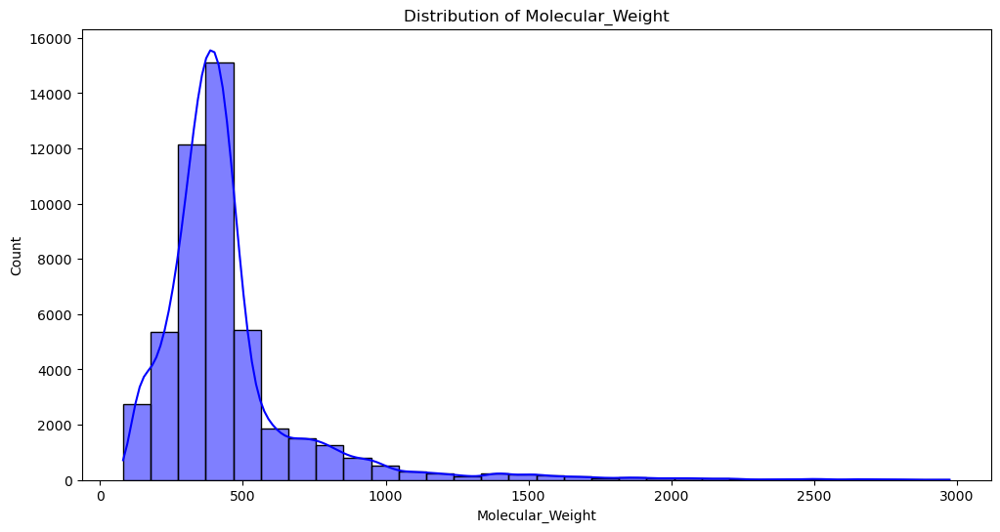


Number_of_Nitrogens Statistics:
Skewness: 3.72, Kurtosis: 38.42
Min: 0, Max: 40


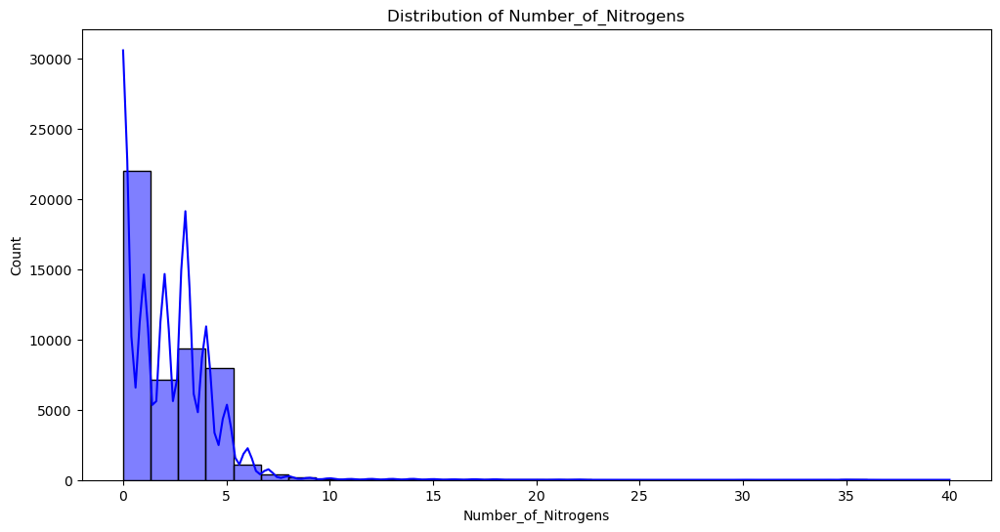


Number_of_Oxygens Statistics:
Skewness: 4.38, Kurtosis: 26.43
Min: 0, Max: 78


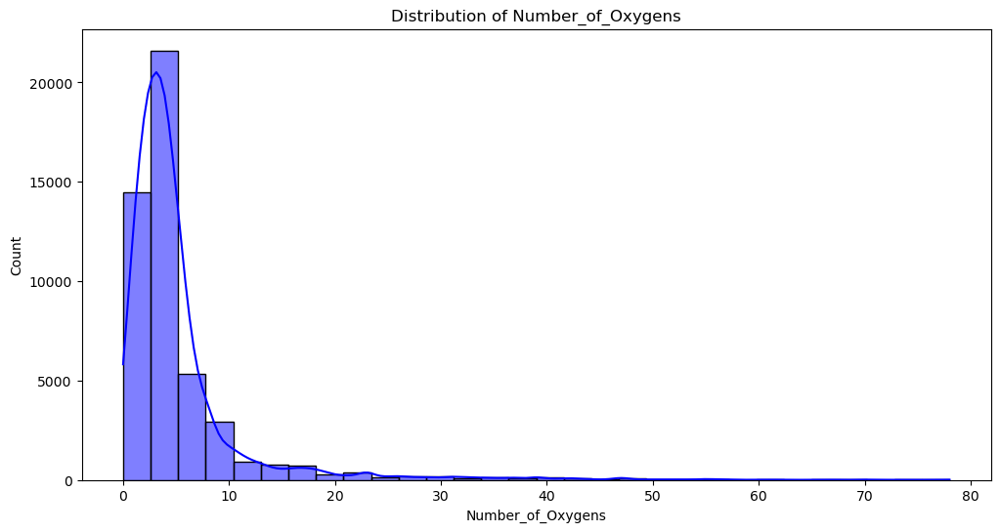


Number_of_Carbons Statistics:
Skewness: 2.52, Kurtosis: 9.86
Min: 0, Max: 156


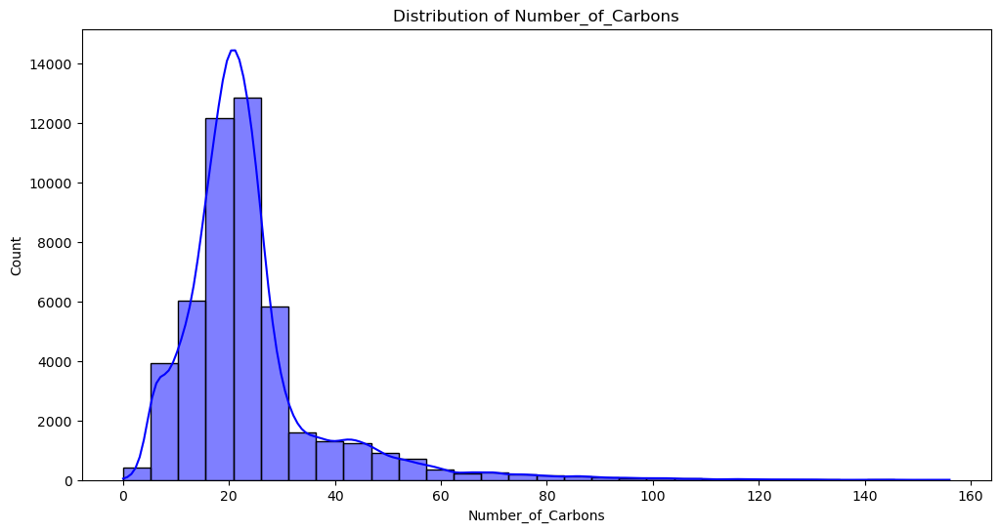


Total_Atom_Number Statistics:
Skewness: 3.01, Kurtosis: 12.62
Min: 6, Max: 486


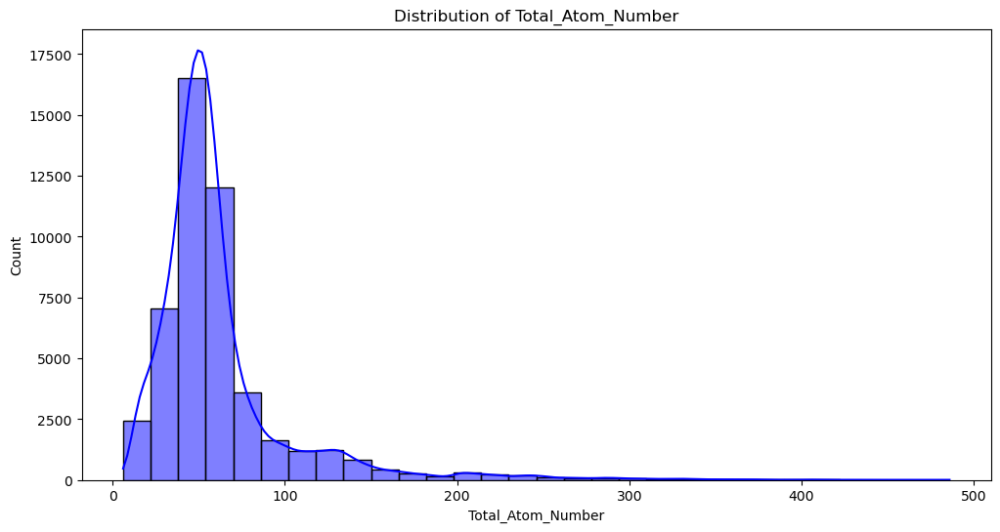


Bond_Count Statistics:
Skewness: 3.11, Kurtosis: 14.89
Min: 5, Max: 231


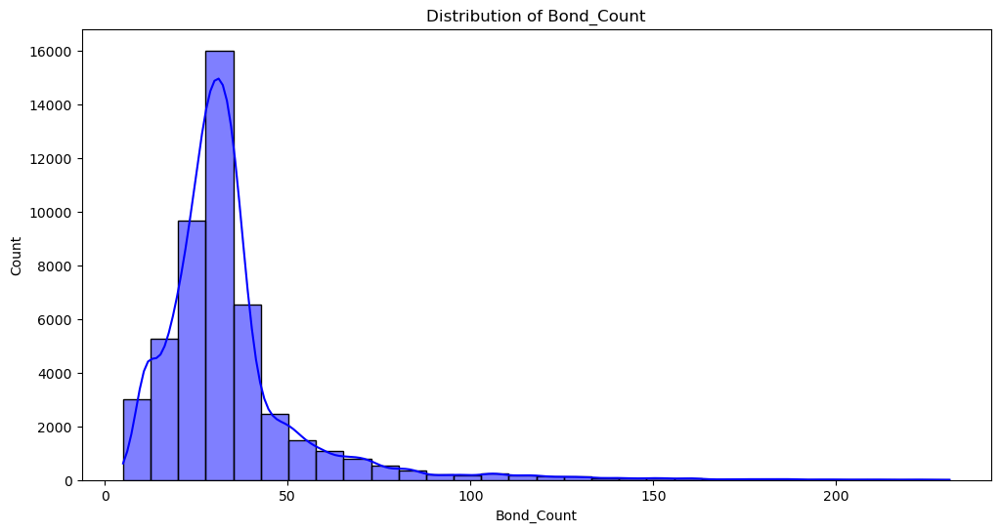


ALogP Statistics:
Skewness: 0.64, Kurtosis: 11.05
Min: -30.24740000000002, Max: 46.16529999999983


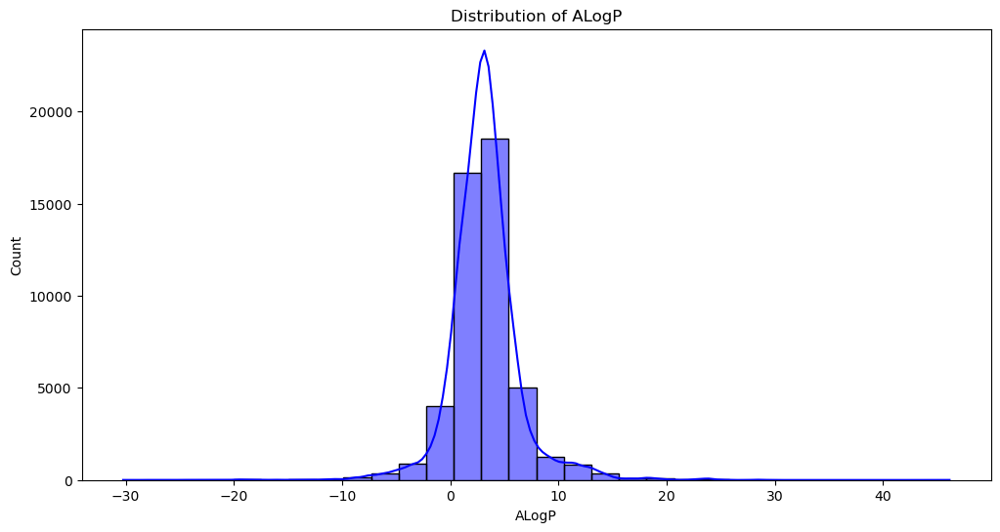


APolarSurfaceArea Statistics:
Skewness: 4.50, Kurtosis: 27.91
Min: 0.0, Max: 1325.0800000000008


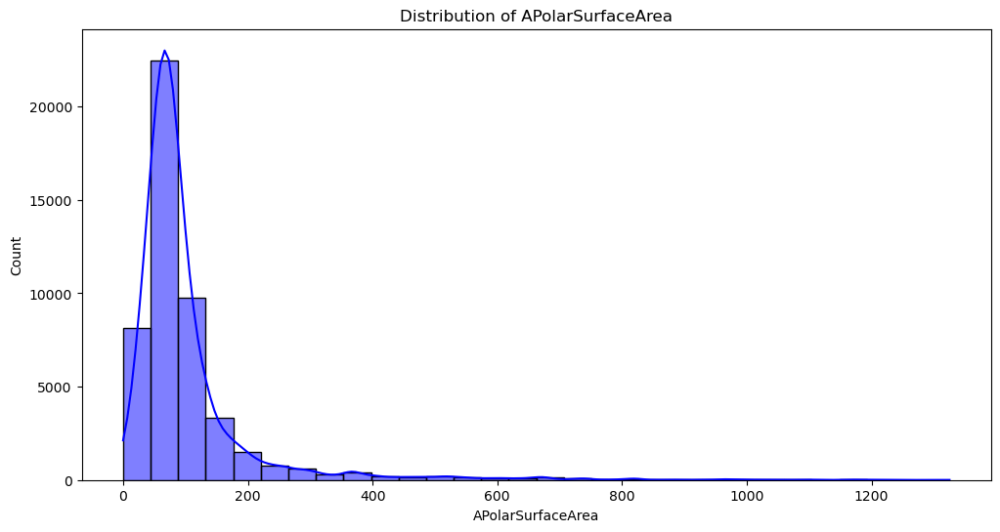


Topo_PSA Statistics:
Skewness: 4.50, Kurtosis: 27.91
Min: 0.0, Max: 1325.0800000000008


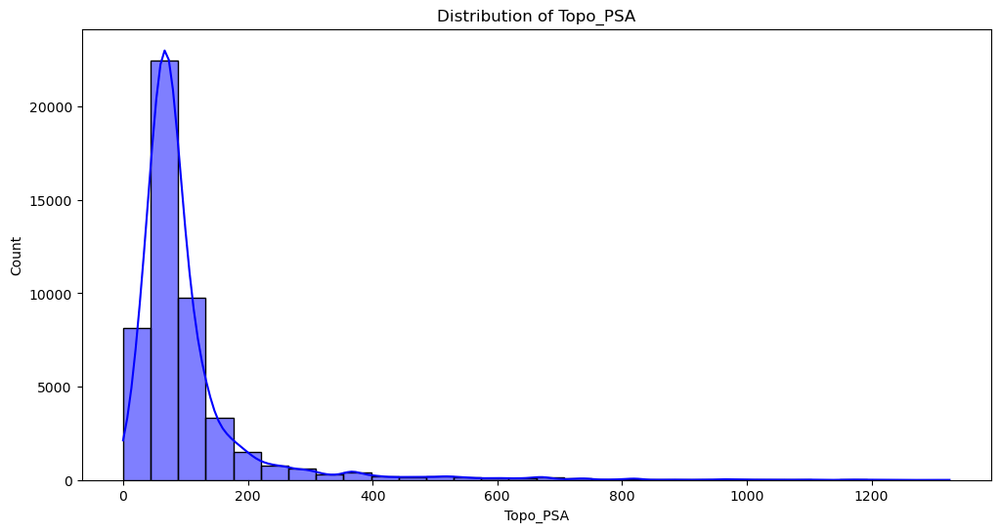

In [21]:
numerical_cols = data.select_dtypes(include=[np.number]).columns
for col in numerical_cols:
    print(f"\n{col} Statistics:")
    print(f"Skewness: {skew(data[col]):.2f}, Kurtosis: {kurtosis(data[col]):.2f}")
    print(f"Min: {data[col].min()}, Max: {data[col].max()}")

    # Histogram with KDE
    plt.figure(figsize=(12, 6))
    sns.histplot(data[col], kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {col}")
    plt.show()

## Summary of Graphs

### Molecular Weight:

Skewness (3.28): The distribution is positively skewed, meaning there are more smaller molecules, with a few large molecules pulling the distribution to the right.

Kurtosis (15.74): The distribution has heavy tails, indicating the presence of extreme outliers (very large molecules), which is reflected in the maximum value of 2973.41.

The min (81.12) and max (2973.41) values show that the dataset contains a significant variety in terms of molecular sizes, from smaller molecules to exceptionally large ones.

### Number of Nitrogens:

Skewness (3.72): The distribution is positively skewed, suggesting most molecules contain few nitrogen atoms, but there are a few with a significantly higher count.

Kurtosis (38.42): The distribution has extreme peakedness with a very sharp peak, implying that most molecules have 0-3 nitrogen atoms, and a small number of molecules have a very high nitrogen count (up to 40).

The min value of 0 and max value of 40 confirm that nitrogen is present in many molecules but in a highly variable manner.

### Number of Oxygens:

Skewness (4.38): The distribution is strongly positively skewed, meaning that most molecules contain a smaller number of oxygen atoms, with a few containing significantly more.

Kurtosis (26.43): The distribution shows high kurtosis, indicating extreme values (outliers) with a sharp peak.

The min value of 0 and max value of 78 show a wide range of oxygen content in the molecules, from no oxygen to a very high number.

### Number of Carbons:

Skewness (2.52): The distribution is positively skewed, meaning most molecules have fewer carbon atoms, with a small number having significantly more.

Kurtosis (9.86): The distribution has moderate kurtosis, suggesting a somewhat peaked distribution with a few high carbon count outliers.

The min (0) and max (156) values suggest molecules range from very low to very high carbon content.

### Total Atom Number:

Skewness (3.01): The distribution is positively skewed, indicating that most molecules have fewer atoms, but there are a few large molecules with a high atom count.

Kurtosis (12.62): The distribution is leptokurtic, meaning it has a high peak and heavy tails, implying the presence of a few large molecules.

The min value of 6 and max value of 486 indicate a wide range of molecule sizes, from small to very large.

### Bond Count:

Skewness (3.11): The distribution is positively skewed, meaning most molecules have a small number of bonds, but a few molecules have many more bonds.

Kurtosis (14.89): The distribution has high kurtosis, indicating that while most molecules have a moderate number of bonds, there are a few molecules with significantly more bonds.

The min value of 5 and max value of 231 show the presence of a broad spectrum of bond counts across molecules.

### ALogP (Lipophilicity):

Skewness (0.64): The distribution is slightly positively skewed, indicating that most molecules have a relatively moderate lipophilicity, with a small number having higher lipophilicity.

Kurtosis (11.05): The distribution shows moderate peakedness, indicating some molecules have extreme lipophilicity values (both very hydrophilic and very hydrophobic).

The min value of -30.25 and max value of 46.17 suggest the presence of both highly hydrophilic and highly hydrophobic molecules.

### Apolar Surface Area:

Skewness (4.50): The distribution is strongly positively skewed, indicating that most molecules have a smaller apolar surface area, but a few have exceptionally large apolar surface areas.

Kurtosis (27.91): The distribution shows extremely high kurtosis, with a very sharp peak, indicating that while most molecules have small apolar surface areas, a few molecules have a very high apolar surface area.

The min value of 0 and max value of 1325.08 indicate a broad range of apolar surface areas, with a few molecules having exceptionally large surface areas.

### Topo_PSA (Topological Polar Surface Area):

Skewness (4.50): Similar to Apolar Surface Area, the distribution is strongly positively skewed, meaning most molecules have a smaller topological polar surface area, but a few have very high values.

Kurtosis (27.91): The distribution has extreme kurtosis, suggesting that the dataset contains a few molecules with large topological polar surface areas.

The min value of 0 and max value of 1325.08 show that the dataset includes molecules with varying polar surface areas, with some molecules having very high values.

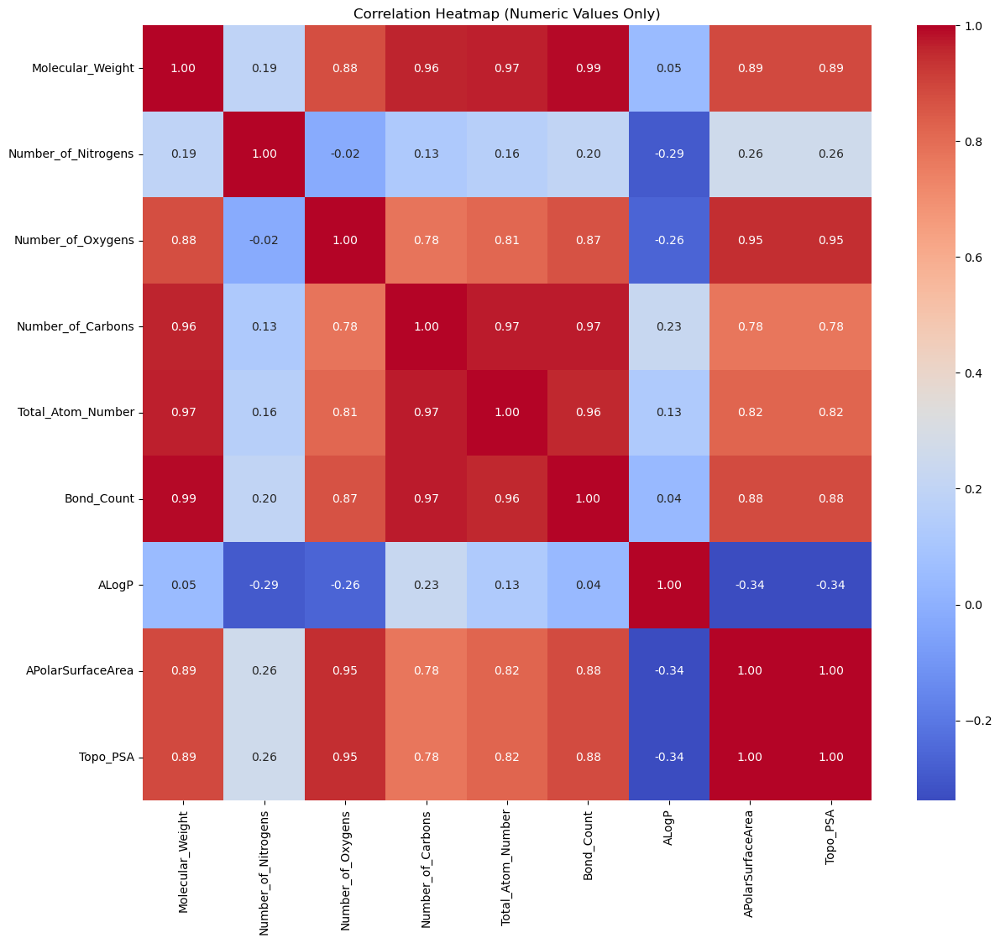

In [23]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Compute correlation matrix for numeric columns
correlation_matrix = numeric_data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (Numeric Values Only)')
plt.show()


<Figure size 1500x1000 with 0 Axes>

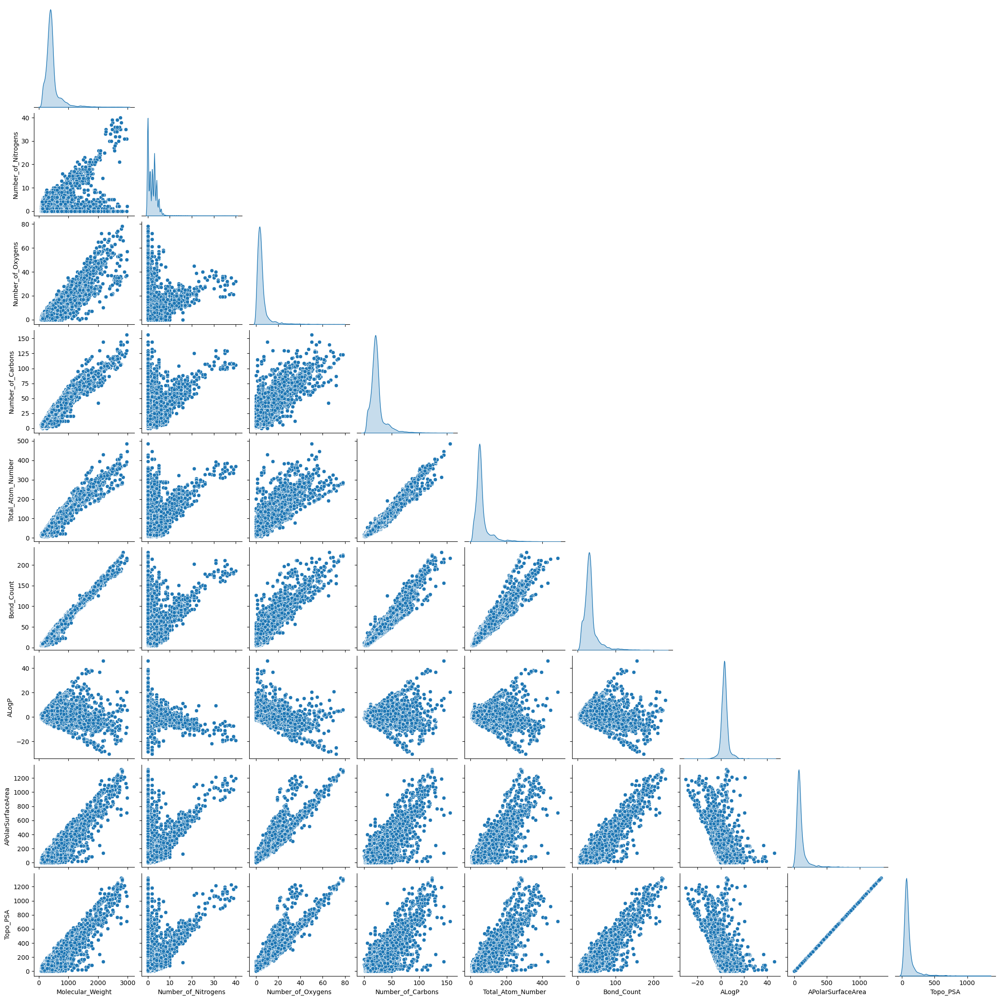

In [25]:
plt.figure(figsize=(15, 10))
selected_features = ['Molecular_Formula', 'Molecular_Weight', 'Number_of_Nitrogens', 'Number_of_Oxygens', 'Number_of_Carbons', 'Total_Atom_Number', 'Bond_Count', 'ALogP','APolarSurfaceArea', 'Topo_PSA' ]
sns.pairplot(data[selected_features], diag_kind='kde', corner=True)
plt.show()

In [29]:
df1 = data[['Molecular_Weight', 'Number_of_Nitrogens', 'Number_of_Oxygens', 
            'Number_of_Carbons', 'Total_Atom_Number', 'Bond_Count', 'ALogP', 
            'APolarSurfaceArea', 'Topo_PSA']]

# Ensure all selected columns are numeric
df1 = df1.apply(pd.to_numeric, errors='coerce')

Correlation between Molecular_Weight and ALogP: 0.05


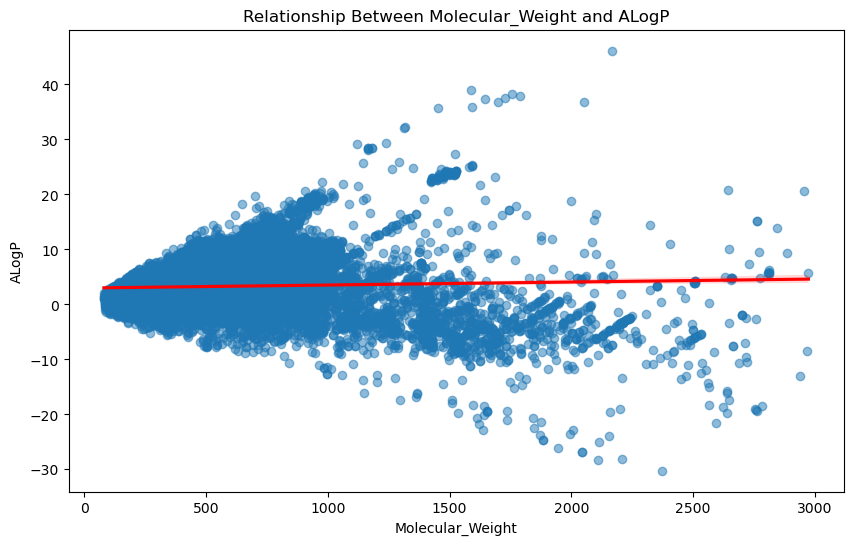

Correlation between Number_of_Nitrogens and ALogP: -0.29


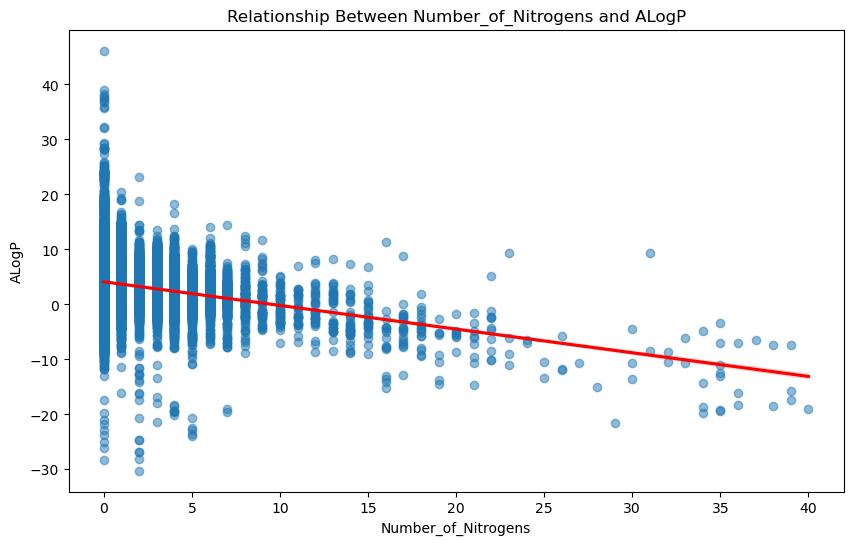

Correlation between Number_of_Oxygens and ALogP: -0.26


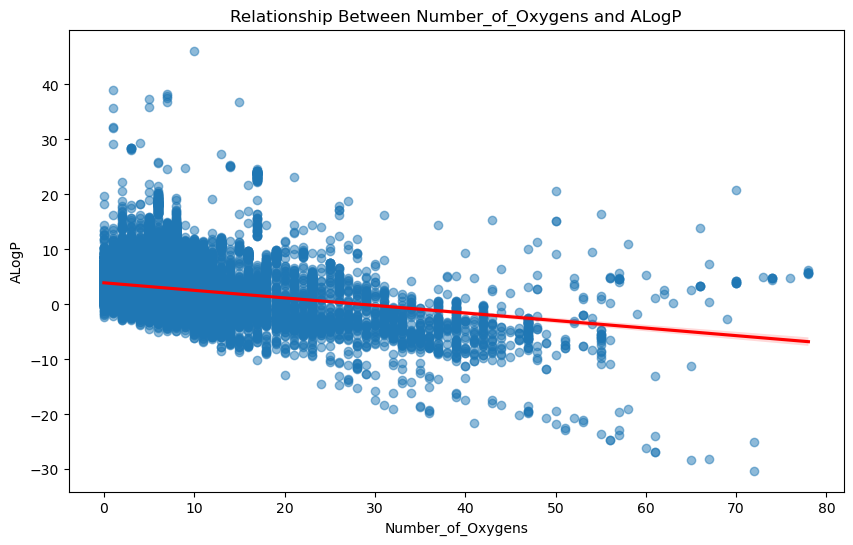

Correlation between Number_of_Carbons and ALogP: 0.23


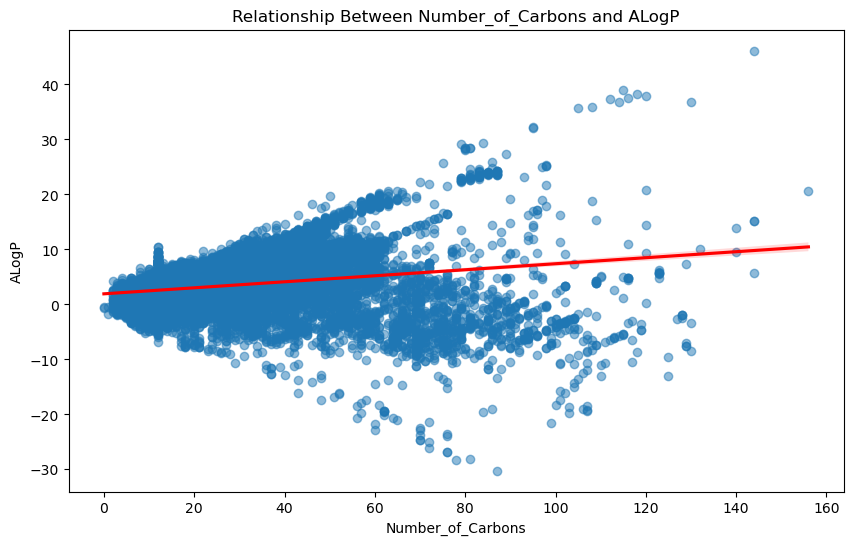

Correlation between Total_Atom_Number and ALogP: 0.13


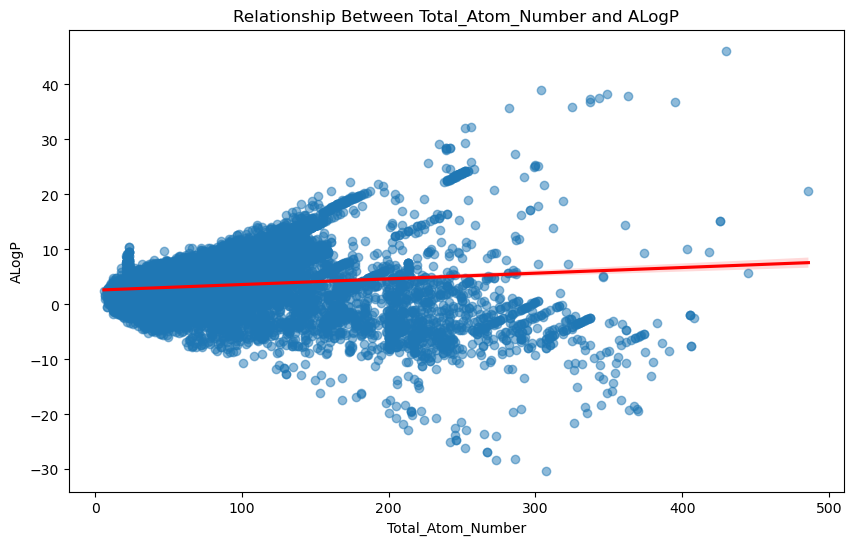

Correlation between Bond_Count and ALogP: 0.04


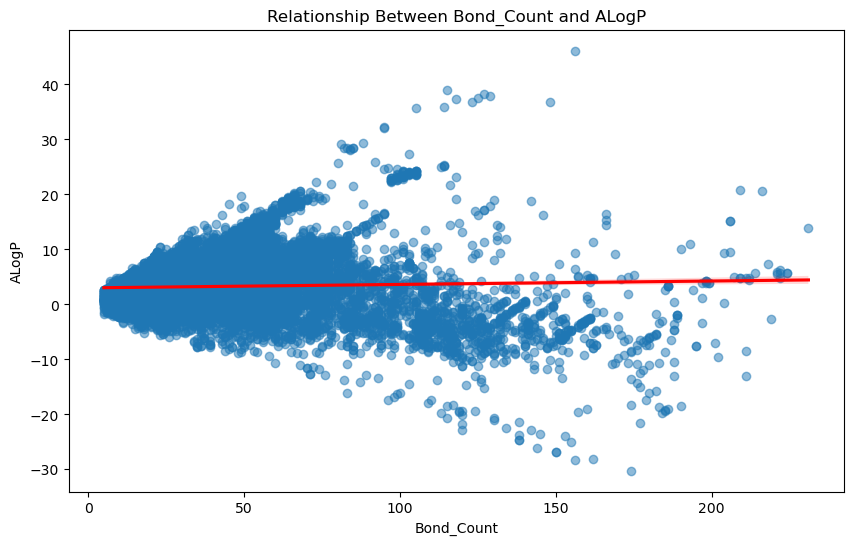

Correlation between APolarSurfaceArea and ALogP: -0.34


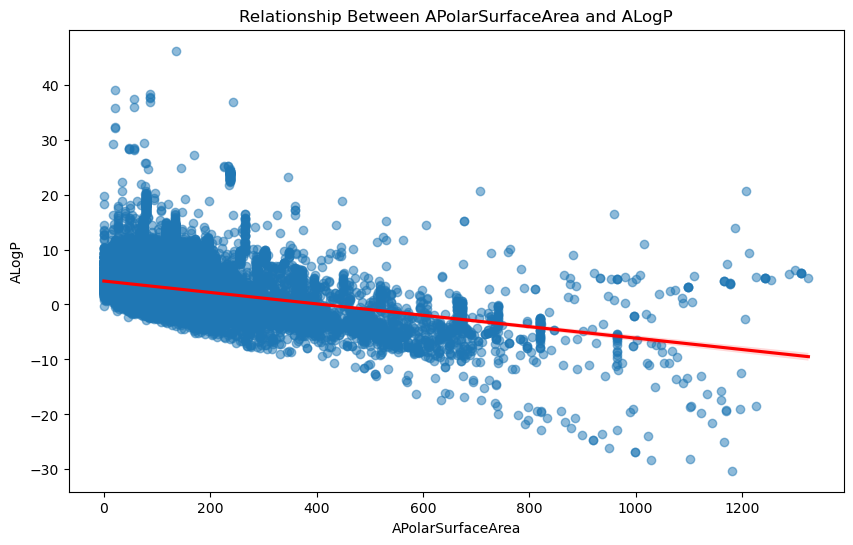

Correlation between Topo_PSA and ALogP: -0.34


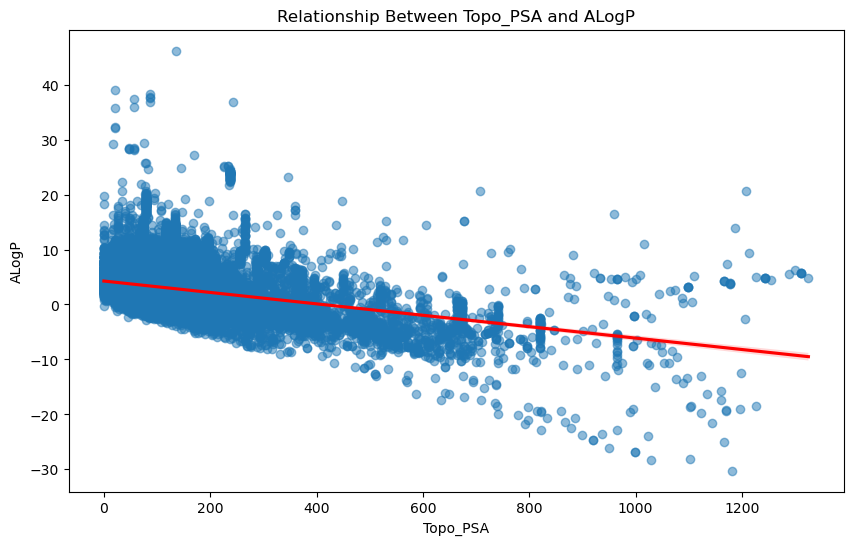

In [30]:
for col in df1.columns:
    if col != 'ALogP':
        corr, _ = pearsonr(df1[col], df1['ALogP'])
        print(f"Correlation between {col} and ALogP: {corr:.2f}")

        # Scatter plot with regression line
        plt.figure(figsize=(10, 6))
        sns.regplot(x=df1[col], y=df1['ALogP'], scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
        plt.title(f'Relationship Between {col} and ALogP')
        plt.xlabel(col)
        plt.ylabel('ALogP')
        plt.show()

## Inferences

### Molecular Weight and ALogP (0.05):

The correlation is very close to 0, indicating no significant relationship between Molecular Weight and ALogP. Molecular weight and lipophilicity appear to be largely independent of each other in this dataset.

### Number of Nitrogens and ALogP (-0.29):

There is a weak negative correlation between the Number of Nitrogens and ALogP, suggesting that as the number of nitrogen atoms in a molecule increases, its lipophilicity tends to decrease slightly. This relationship is not very strong, but it suggests a possible trend.

### Number of Oxygens and ALogP (-0.26):

There is a weak negative correlation between the Number of Oxygens and ALogP, implying that as the number of oxygen atoms in a molecule increases, its lipophilicity tends to decrease slightly. Oxygen atoms, being more polar, are likely to lower lipophilicity.

### Number of Carbons and ALogP (0.23):

The correlation is weakly positive, indicating that as the number of carbon atoms increases, there is a slight tendency for the molecule to become more lipophilic (hydrophobic). This is consistent with the idea that larger carbon chains (which are nonpolar) generally increase lipophilicity.

### Total Atom Number and ALogP (0.13):

The positive correlation is weak, suggesting a slight tendency for larger molecules (in terms of total atom count) to have a higher lipophilicity. However, the correlation is weak enough to suggest that other factors, not just atom count, play a larger role in determining lipophilicity.

### Bond Count and ALogP (0.04):

The correlation is very close to 0, indicating no meaningful relationship between Bond Count and ALogP. The number of bonds in the molecule does not appear to affect its lipophilicity.

### Apolar Surface Area and ALogP (-0.34):

There is a moderate negative correlation between Apolar Surface Area and ALogP, suggesting that molecules with a larger apolar surface area tend to be less lipophilic (more hydrophilic). Apolar surface area is related to the nonpolar portion of the molecule, and a larger nonpolar surface can reduce overall lipophilicity.

### Topo_PSA and ALogP (-0.34):

Similarly, the negative correlation between Topo_PSA (Topological Polar Surface Area) and ALogP indicates that as the polar surface area of the molecule increases, its lipophilicity decreases. This makes sense because molecules with a higher polar surface area tend to be more hydrophilic and less lipophilic.

### Overall Inferences:
Molecular weight and bond count have little to no effect on lipophilicity (ALogP).

The number of nitrogens, oxygens, and polar surface area (both apolar and topological) have a moderate to weak negative correlation with lipophilicity, indicating that as these features increase, lipophilicity tends to decrease. This is consistent with the idea that more polar or heteroatom-rich molecules (e.g., containing nitrogen or oxygen) are generally less hydrophobic (less lipophilic).

The number of carbons and total atom count show a slightly positive correlation with lipophilicity, meaning larger, more carbon-rich molecules tend to be more lipophilic.

In general, the correlations between these features and ALogP suggest that molecular size, polarity, and the presence of heteroatoms like nitrogen and oxygen play a role in determining lipophilicity, but the effects are relatively weak and could be influenced by other factors not captured in these features.

<Figure size 800x600 with 0 Axes>

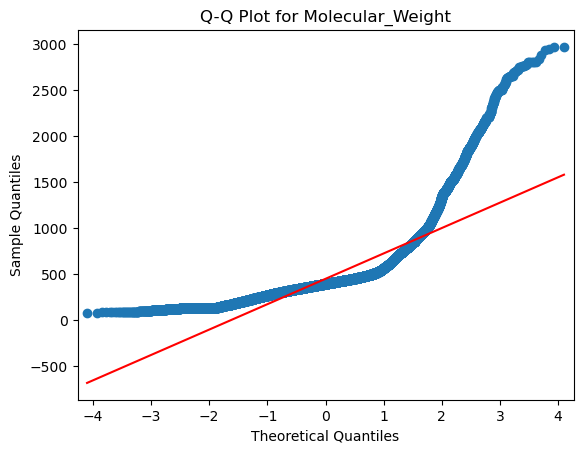

<Figure size 800x600 with 0 Axes>

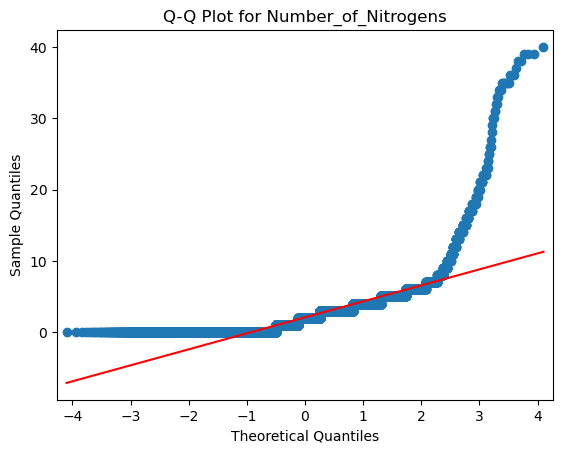

<Figure size 800x600 with 0 Axes>

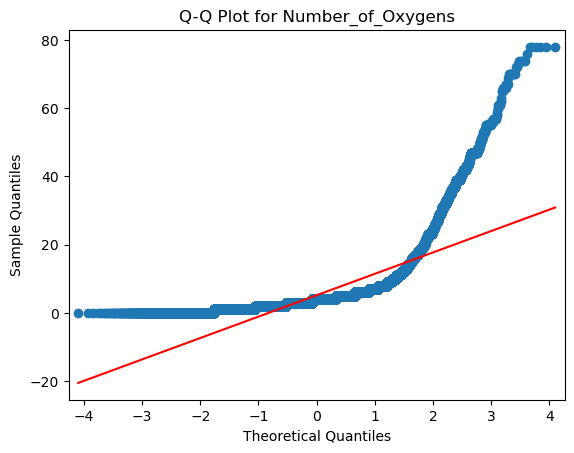

<Figure size 800x600 with 0 Axes>

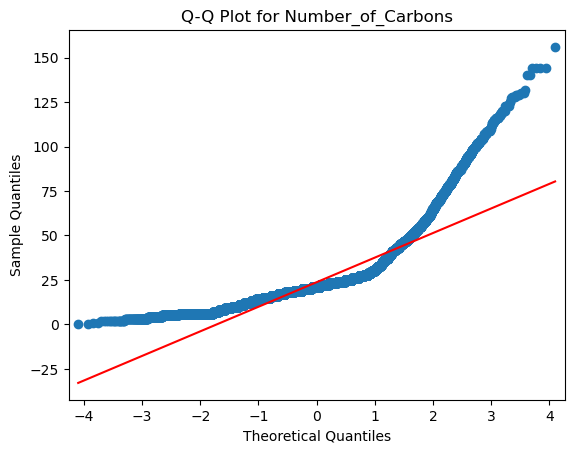

<Figure size 800x600 with 0 Axes>

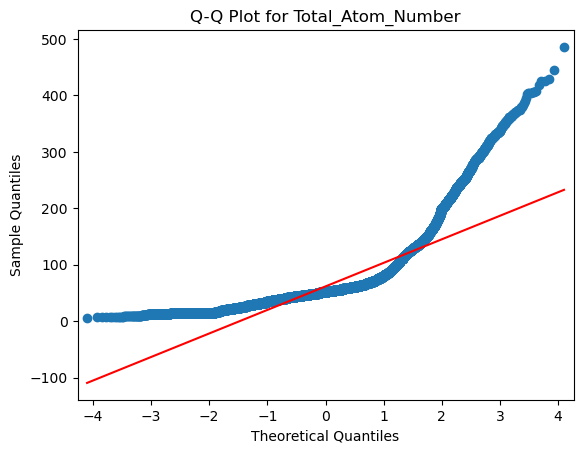

<Figure size 800x600 with 0 Axes>

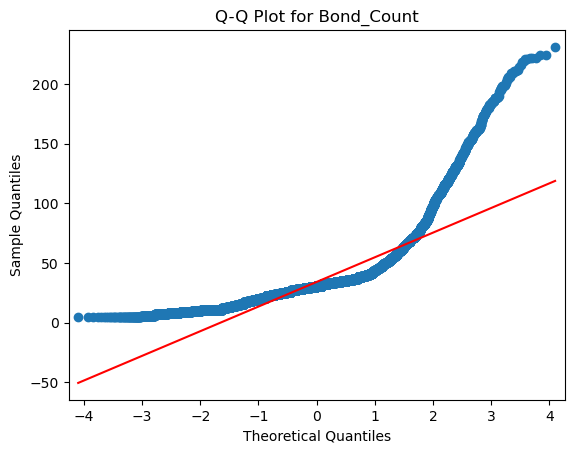

<Figure size 800x600 with 0 Axes>

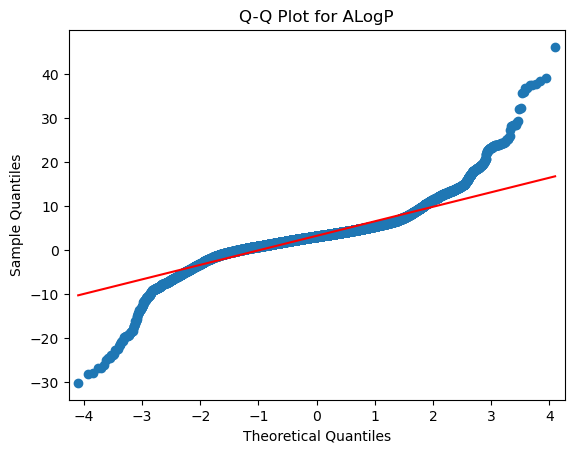

<Figure size 800x600 with 0 Axes>

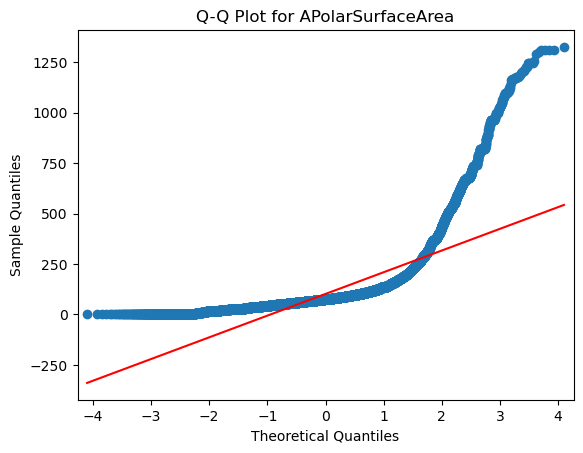

<Figure size 800x600 with 0 Axes>

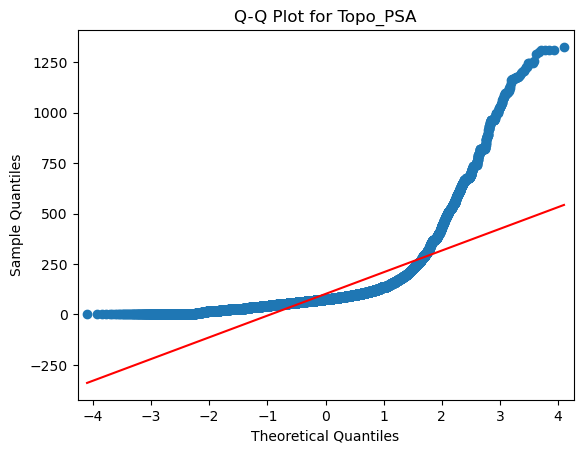

In [31]:
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    qqplot(data[col], line='s')
    plt.title(f"Q-Q Plot for {col}")
    plt.show()

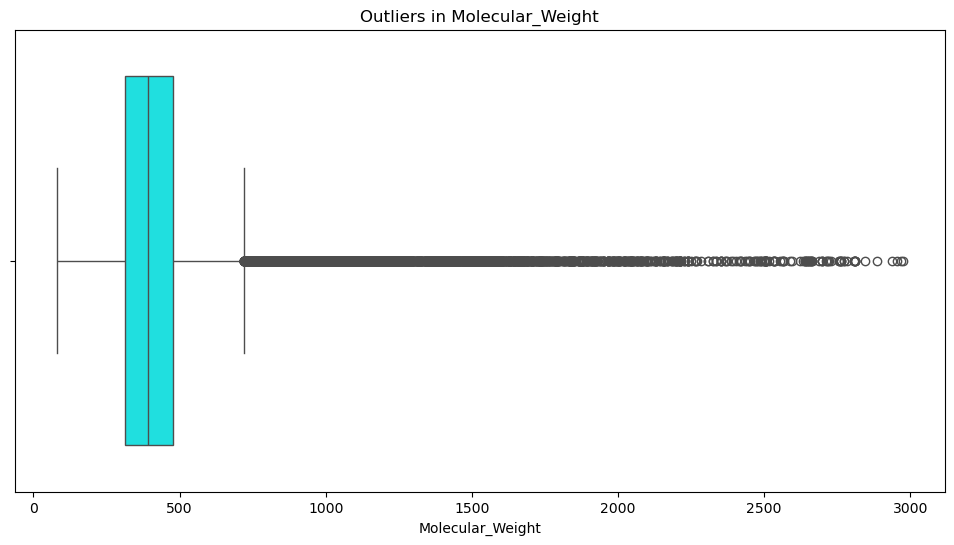

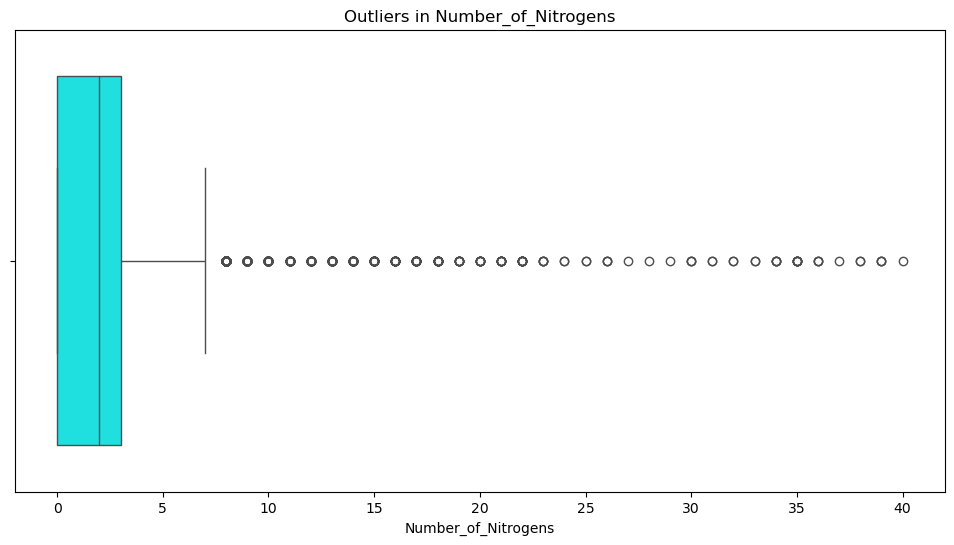

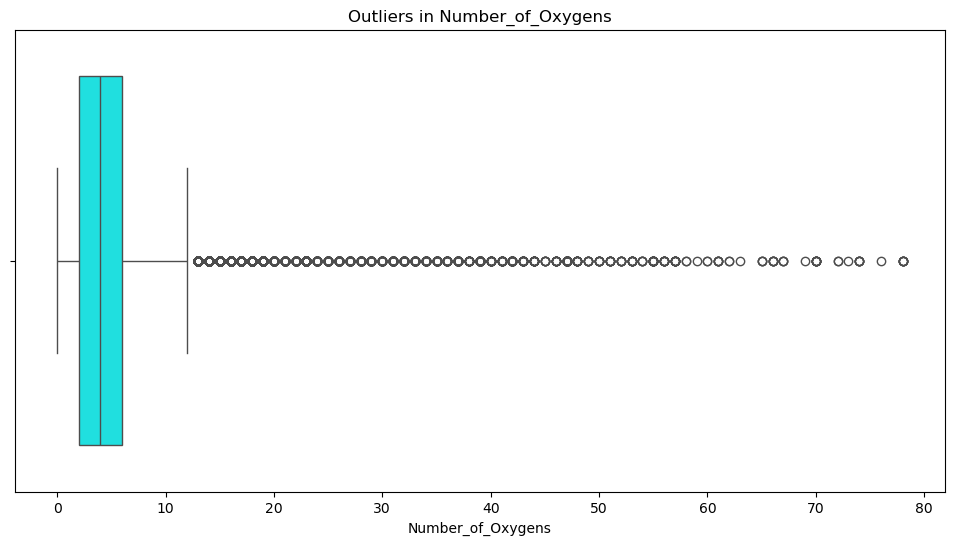

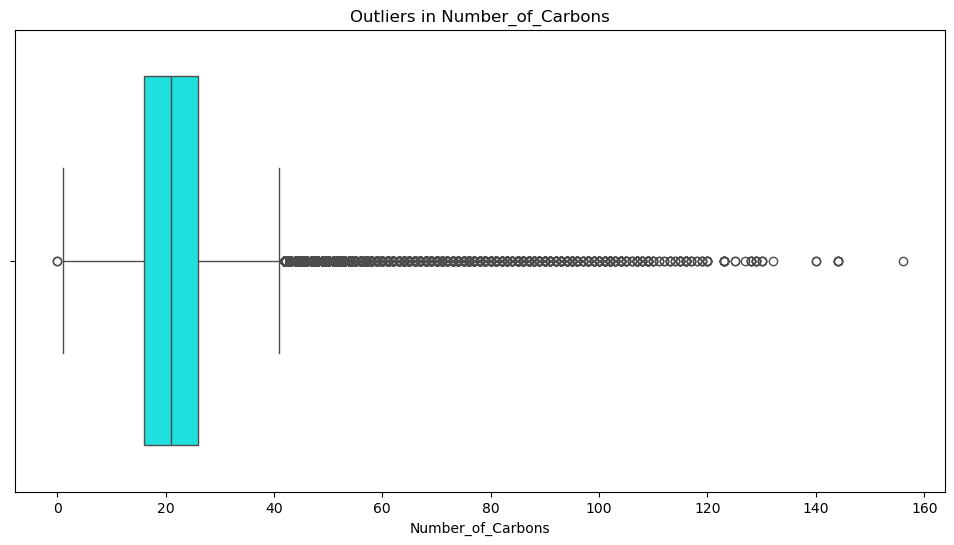

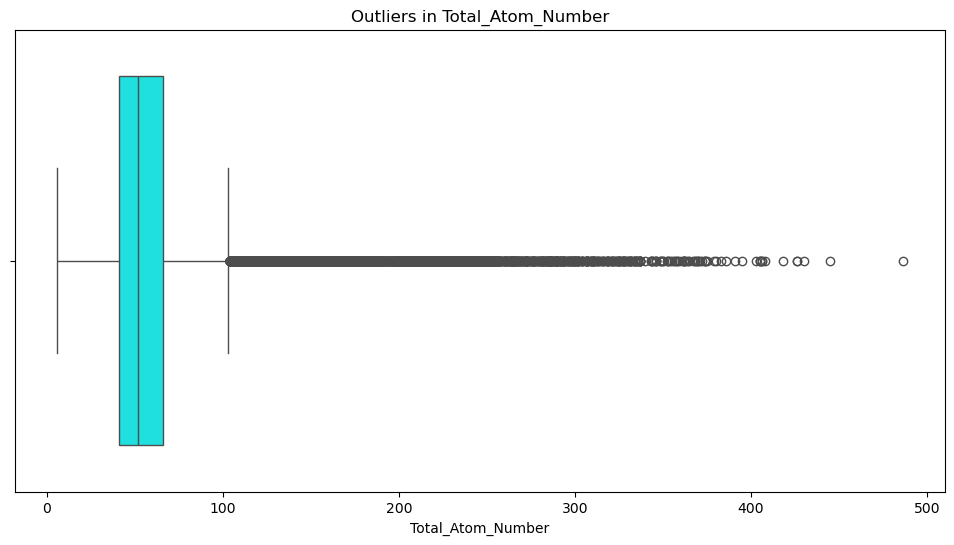

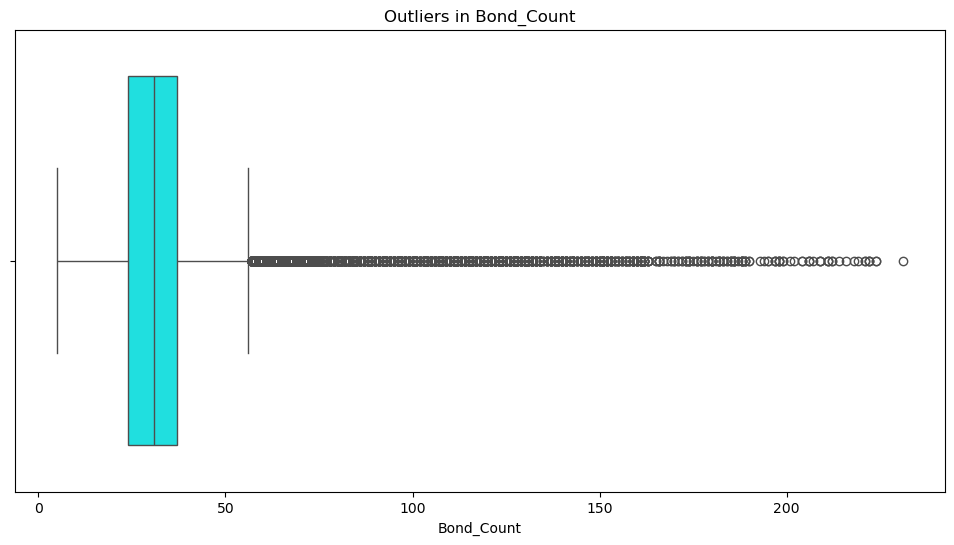

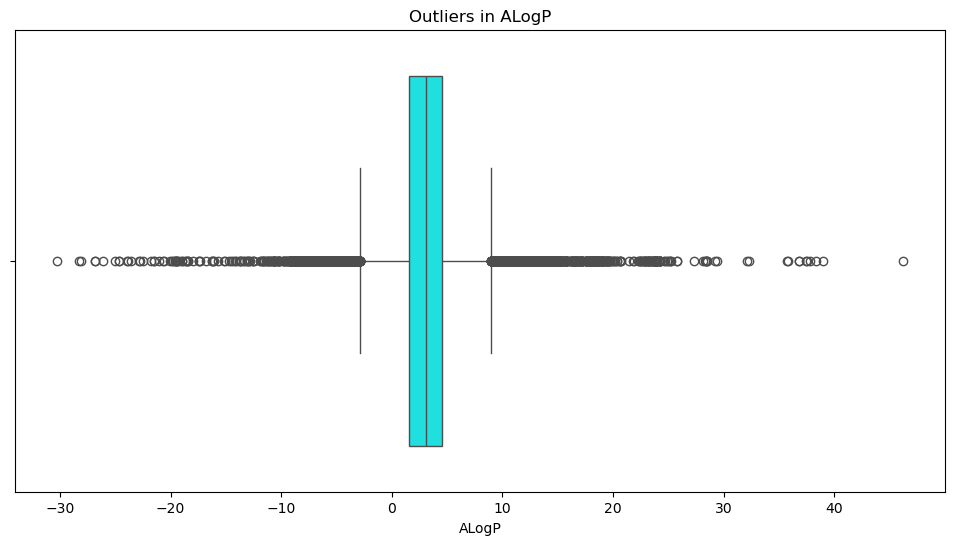

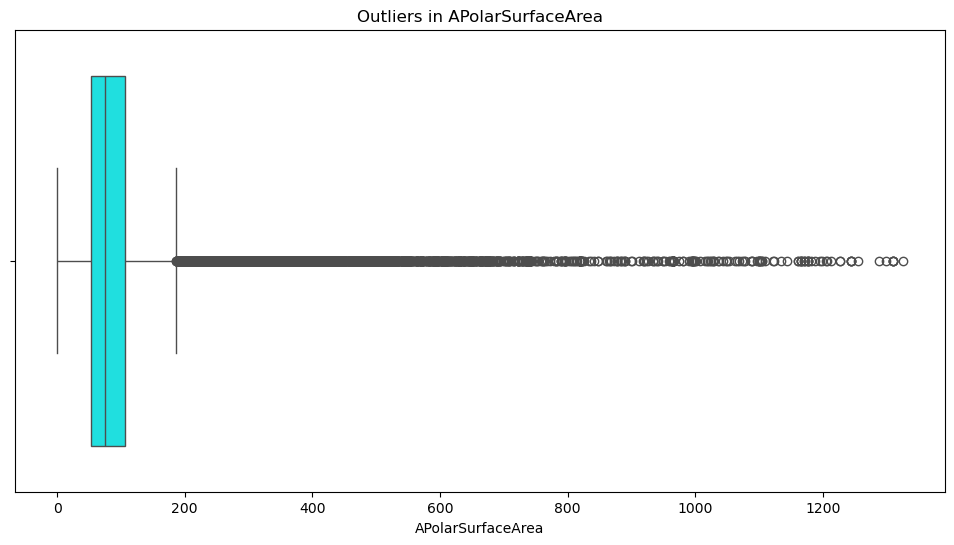

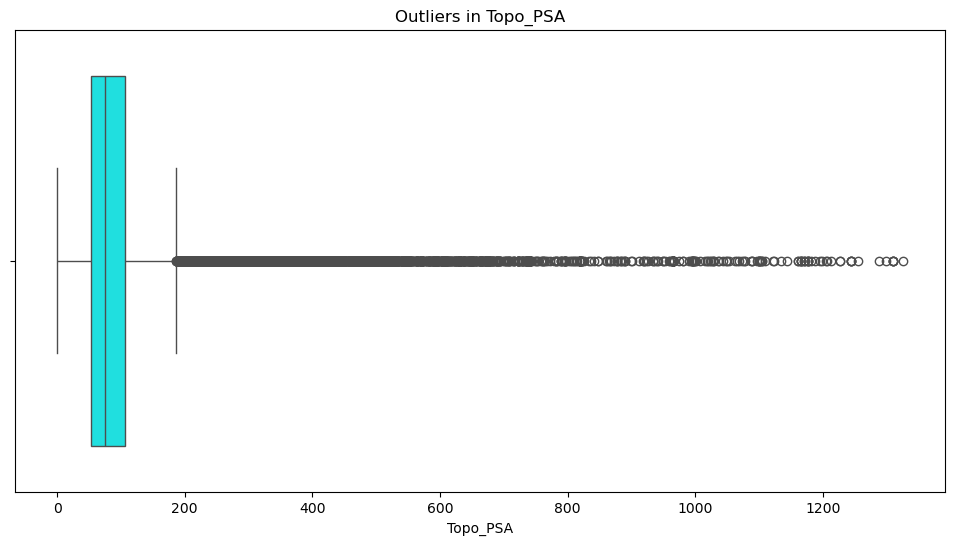

In [32]:
for col in numerical_cols:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=data[col], color='cyan')
    plt.title(f'Outliers in {col}')
    plt.show()

C:\Windows\Temp\ipykernel_5376\2498369002.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_with_target.index, y=corr_with_target.values, palette='viridis')


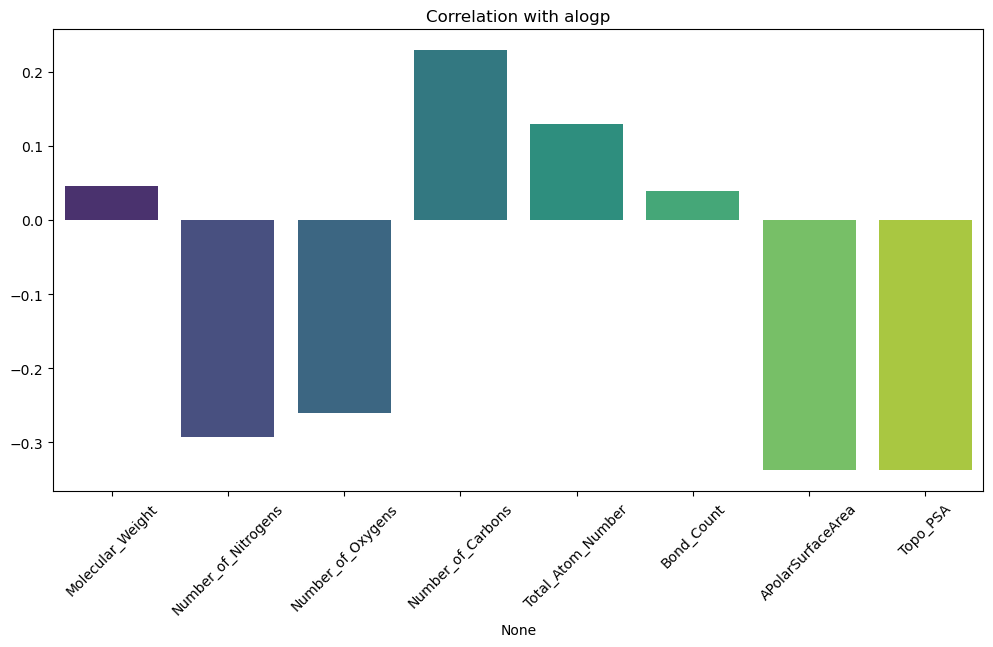

In [34]:
corr_with_target = correlation_matrix['ALogP'].drop('ALogP')
plt.figure(figsize=(12, 6))
sns.barplot(x=corr_with_target.index, y=corr_with_target.values, palette='viridis')
plt.title('Correlation with alogp')
plt.xticks(rotation=45)
plt.show()


Feature Interaction Analysis:


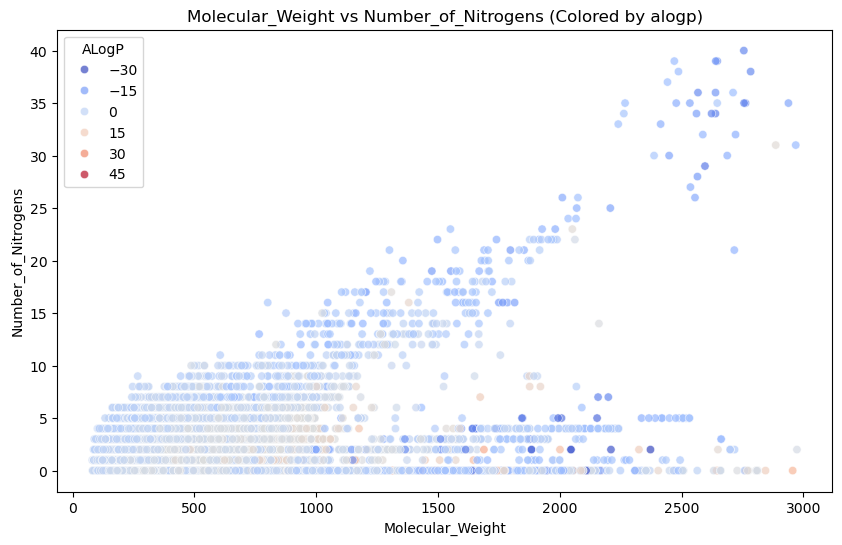

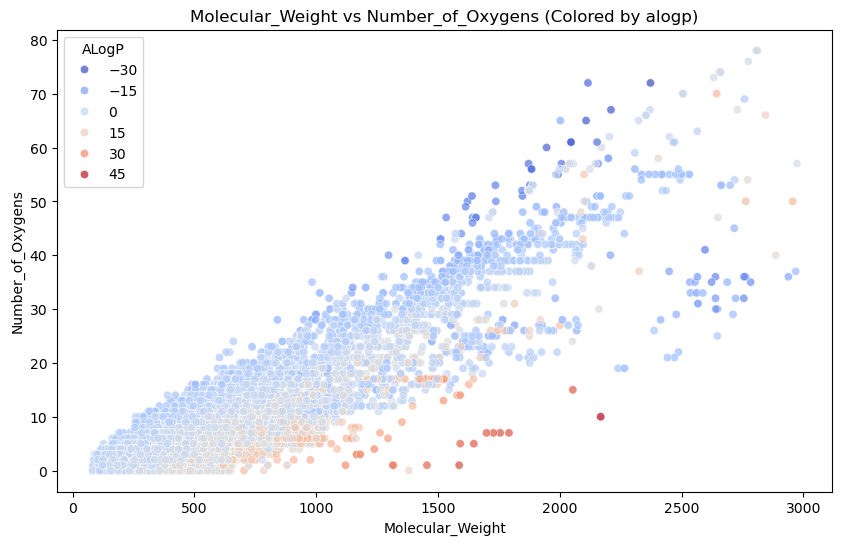

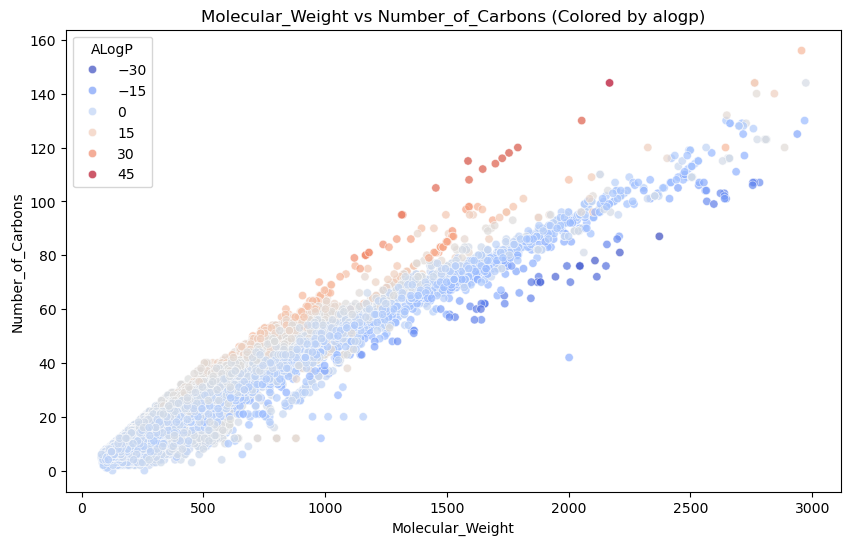

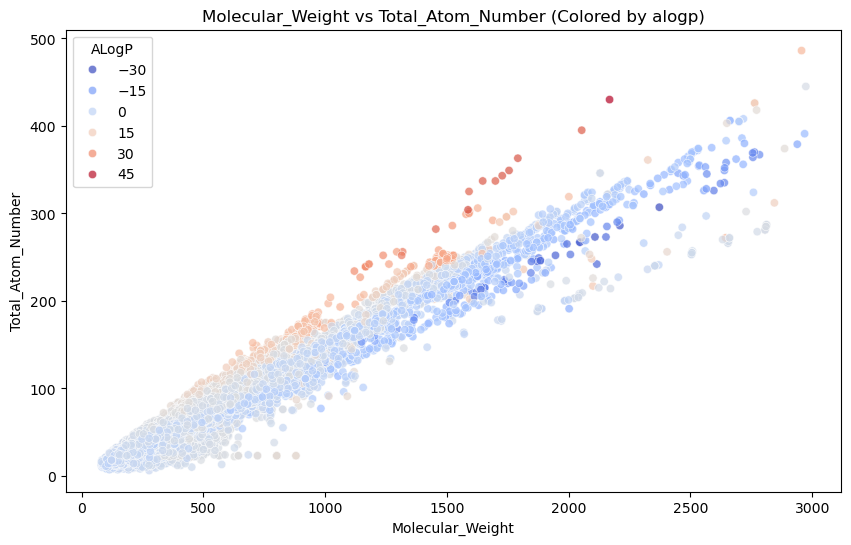

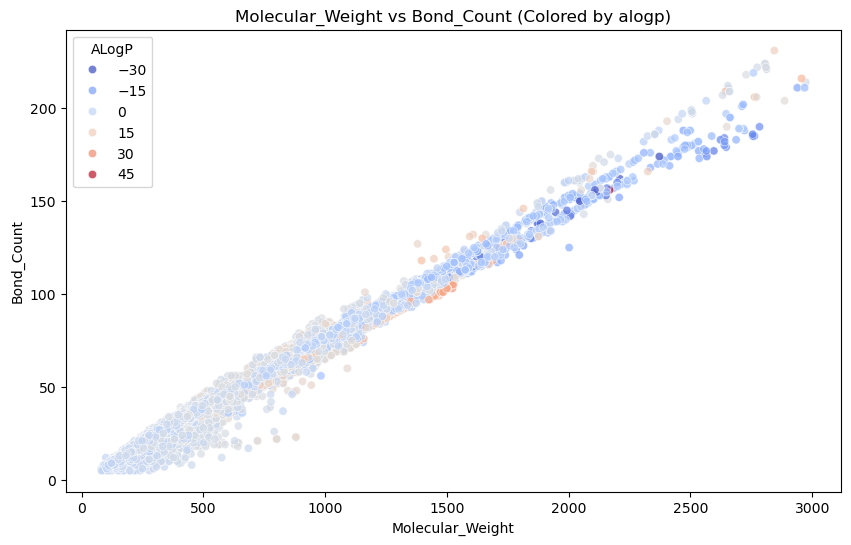

...

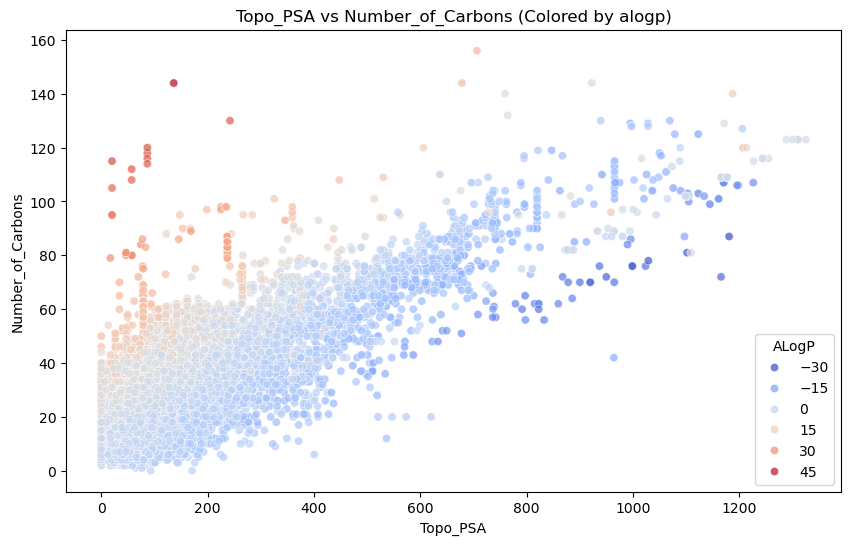

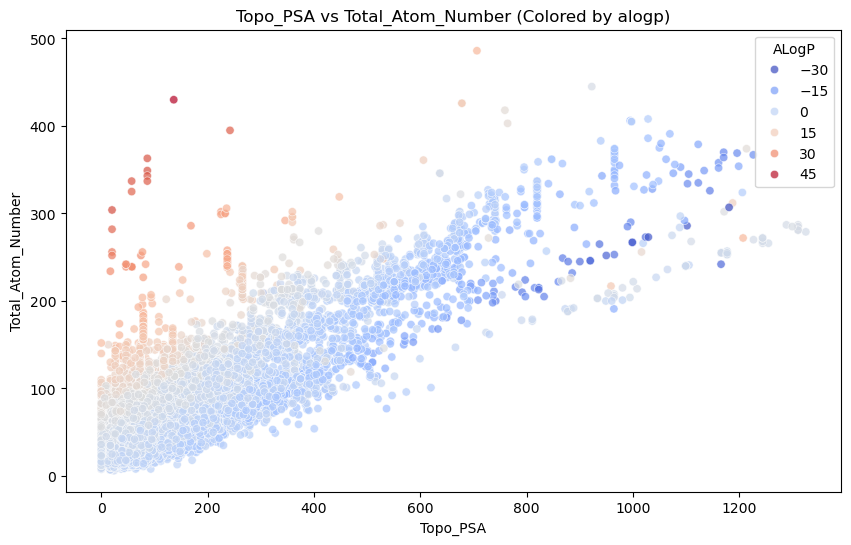

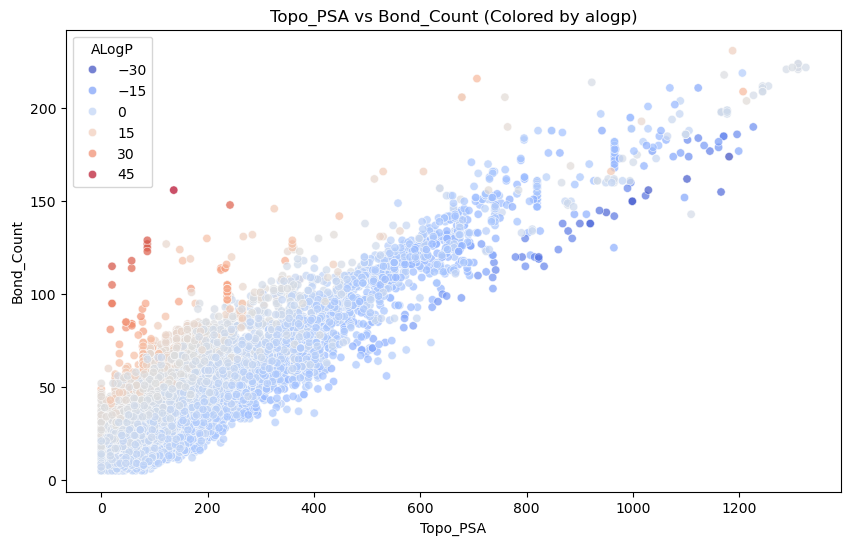

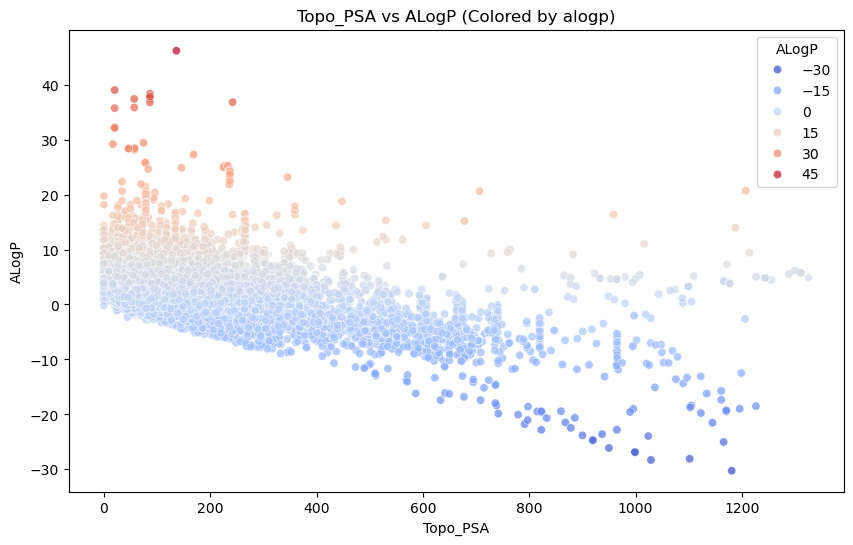

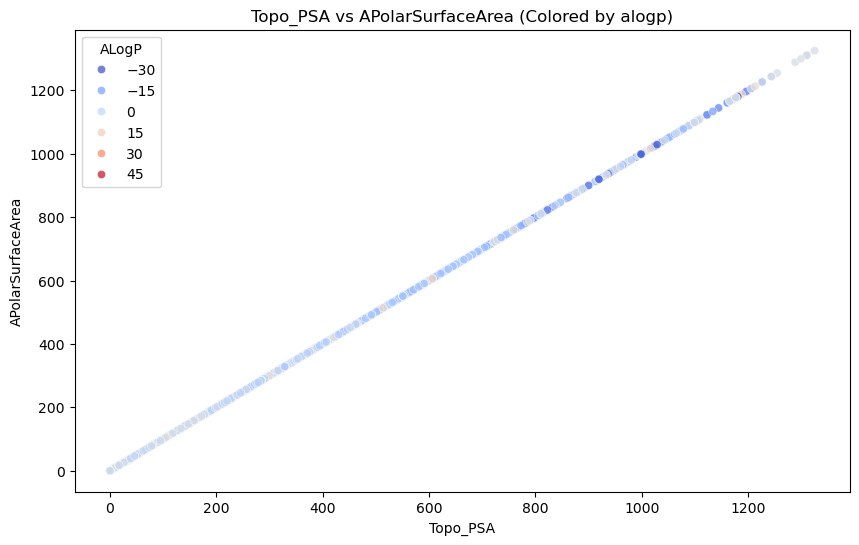

In [37]:
print("\nFeature Interaction Analysis:")
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=data[col1], y=data[col2], hue=data['ALogP'], palette='coolwarm', alpha=0.7)
            plt.title(f'{col1} vs {col2} (Colored by alogp)')
            plt.show()


Pairwise Heatmap Analysis:


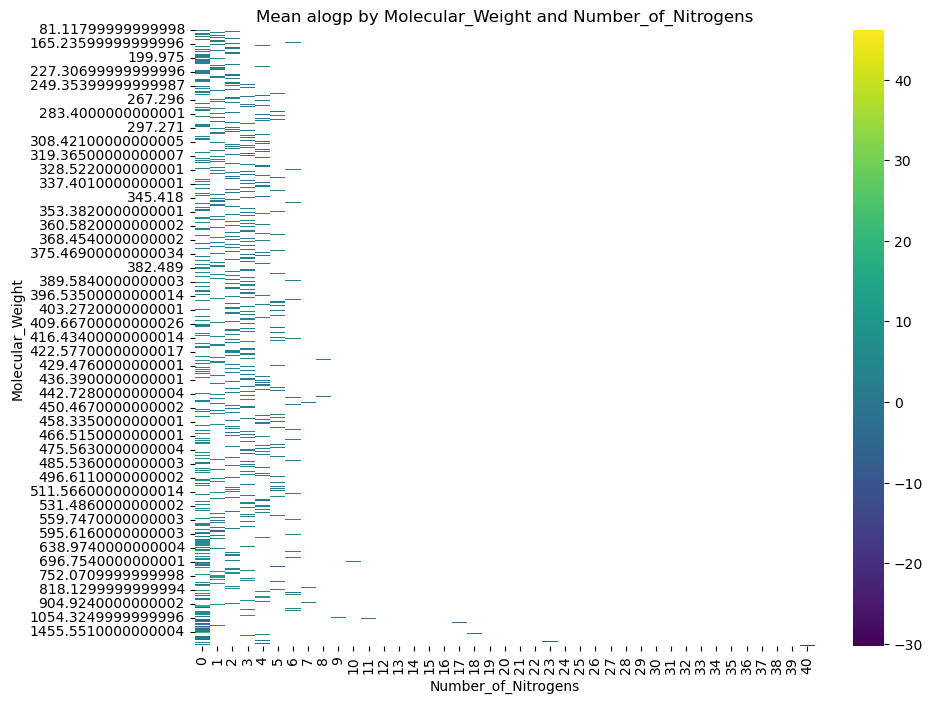

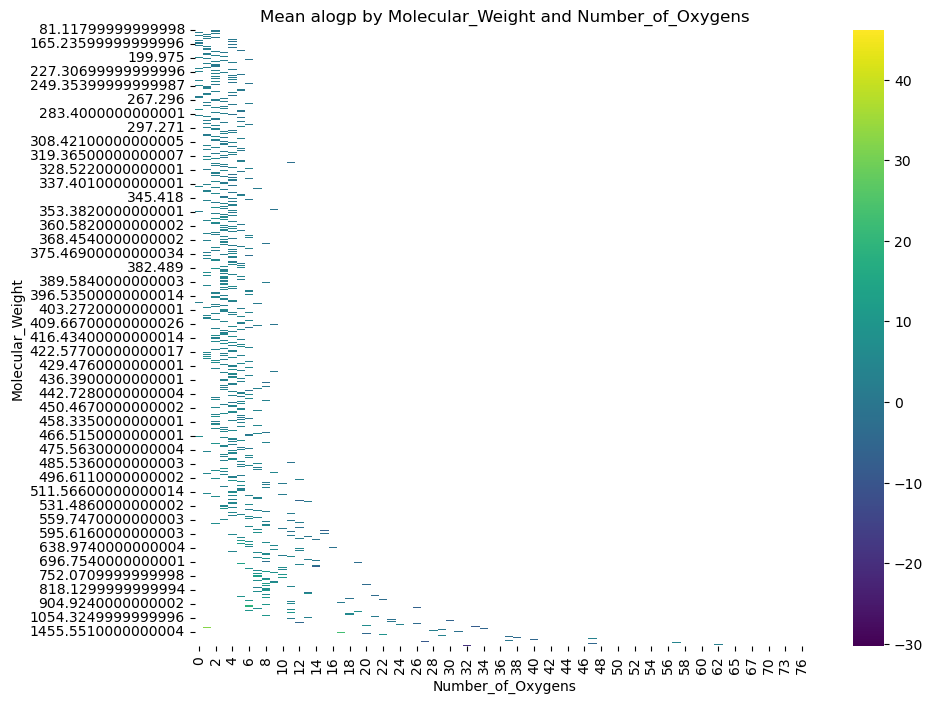

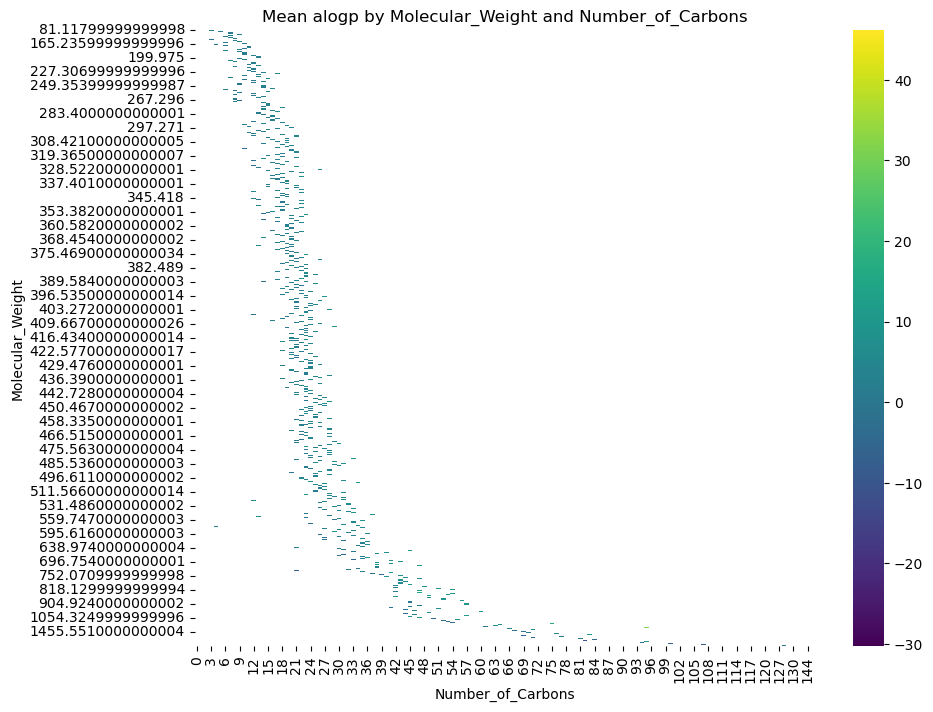

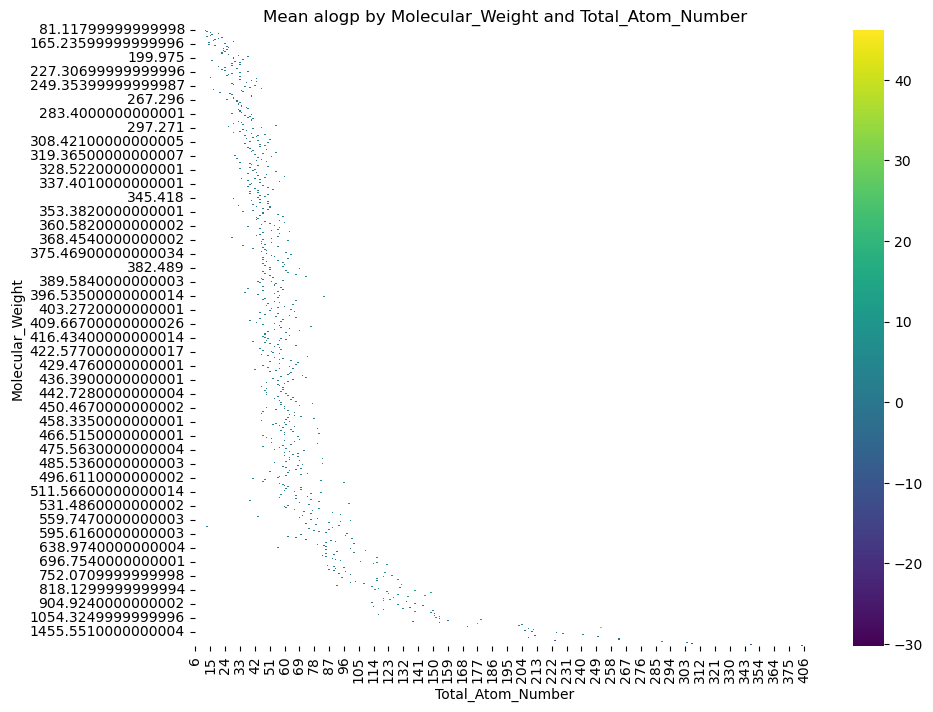

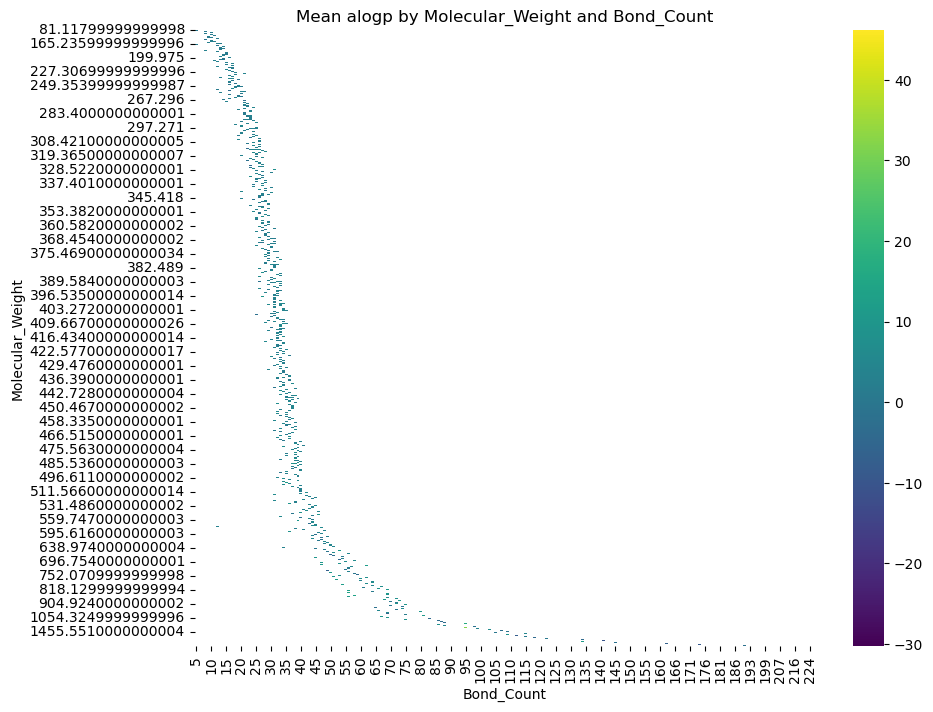

MemoryError: Unable to allocate 1.24 GiB for an array with shape (40177, 33168) and data type bool

<Figure size 1000x800 with 0 Axes>

In [38]:
print("\nPairwise Heatmap Analysis:")
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            grouped = data.groupby([col1, col2])['ALogP'].mean().unstack()
            plt.figure(figsize=(10, 8))
            sns.heatmap(grouped, cmap='viridis')
            plt.title(f'Mean alogp by {col1} and {col2}')
            plt.show()

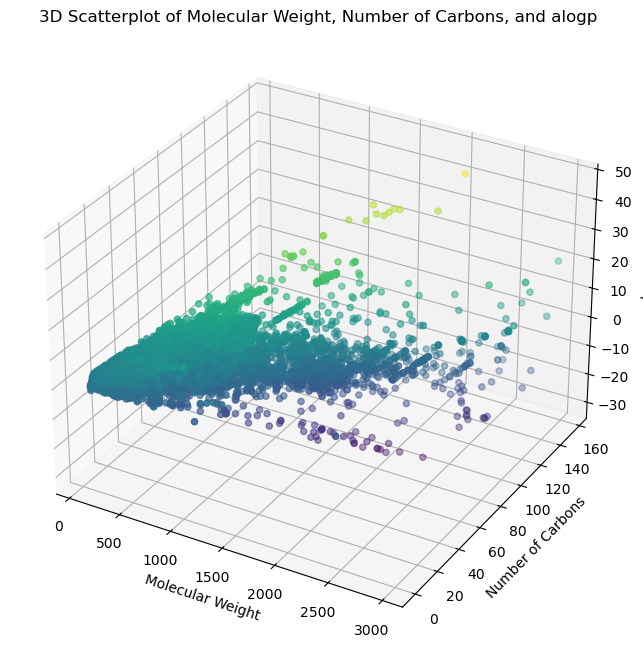

In [39]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data['Molecular_Weight'], data['Number_of_Carbons'], data['ALogP'], c=data['ALogP'], cmap='viridis')
ax.set_xlabel('Molecular Weight')
ax.set_ylabel('Number of Carbons')
ax.set_zlabel('alogp')
plt.title('3D Scatterplot of Molecular Weight, Number of Carbons, and alogp')
plt.show()

In [41]:
from scipy.stats import zscore
data['zscore_alogp'] = zscore(data['ALogP'])
outliers = data[np.abs(data['zscore_alogp']) > 3]
outliers

C:\Windows\Temp\ipykernel_5376\1985237014.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['zscore_alogp'] = zscore(data['ALogP'])


,Coconut_ID,Molecular_Formula,Molecular_Weight,Number_of_Nitrogens,Number_of_Oxygens,Number_of_Carbons,Total_Atom_Number,Bond_Count,ALogP,APolarSurfaceArea,Topo_PSA,zscore_alogp
253,CNP0000278,C73H88N4O4,1085.531,4,4,73,169,88,18.28944,120.96,120.96,4.569469
255,CNP0000280,C54H84O6,829.260,0,6,54,144,60,13.67810,100.90,100.90,3.172283
1076,CNP0001103,C91H153N5O41,1973.219,5,41,91,290,148,-6.77900,711.94,711.94,-3.025995
1152,CNP0001179,C75H90N4O8,1175.565,4,8,75,177,95,16.57834,176.86,176.86,4.051024
1320,CNP0001354,C98H190O14,1592.584,0,14,98,302,114,25.18110,225.06,225.06,6.657567
...,...,...,...,...,...,...,...,...,...,...,...,...
47940,CNP0079348,C64H108O35,1437.533,0,35,64,207,109,-8.68170,554.05,554.05,-3.602492
48182,CNP0079631,C92H142O48,2016.100,0,48,92,282,154,-8.63000,744.72,744.72,-3.586828
48376,CNP0079859,C92H148O47,2006.149,0,47,92,287,152,-8.39730,735.49,735.49,-3.516322
48382,CNP0079866,C104H162O56,2308.384,0,56,104,322,176,-10.92640,862.56,862.56,-4.282612


In [42]:
print("\nSummary of Key Insights:")
print(f"Top Correlated Feature with alogp: {corr_with_target.idxmax()} ({corr_with_target.max():.2f})")
print(f"Lowest Correlated Feature with alogp: {corr_with_target.idxmin()} ({corr_with_target.min():.2f})")
print(f"Number of Outliers Detected in alogp: {outliers.shape[0]}")


Summary of Key Insights:
Top Correlated Feature with alogp: Number_of_Carbons (0.23)
Lowest Correlated Feature with alogp: APolarSurfaceArea (-0.34)
Number of Outliers Detected in alogp: 886


## Top Correlated Feature with ALogP: Number_of_Carbons (0.23)

The Number of Carbons has the strongest correlation with ALogP among the features, although the correlation is weak to moderate (0.23). This means that as the number of carbon atoms in a molecule increases, its lipophilicity (ALogP) tends to increase slightly, indicating a positive relationship. Larger carbon chains are typically nonpolar and contribute to greater hydrophobicity, which aligns with a more lipophilic character.

## Lowest Correlated Feature with ALogP: APolarSurfaceArea (-0.34)
The Apolar Surface Area has the strongest negative correlation with ALogP, with a value of -0.34. This suggests that as the apolar surface area (the nonpolar surface of the molecule) increases, the lipophilicity (ALogP) decreases. This is because molecules with a larger apolar surface are generally more hydrophilic, meaning they interact more with water and less with hydrophobic environments, resulting in lower lipophilicity.

## Number of Outliers Detected in ALogP: 886
There are 886 outliers detected in the ALogP data, which suggests that a significant portion of the data points deviates from the expected distribution or typical range for lipophilicity. These outliers could represent extreme values of lipophilicity, which may need to be investigated further. Outliers can have a strong influence on statistical analysis and model performance, so they may need to be handled (e.g., removed, transformed, or treated separately) depending on the analysis objectives.

## Conclusion:
ALogP (lipophilicity) is most strongly influenced by the number of carbon atoms, with a weak positive correlation.
Apolar Surface Area has the largest negative effect on lipophilicity, suggesting that a larger apolar area makes the molecule less lipophilic.
The presence of 886 outliers in the ALogP data indicates that there are some extreme values which could impact the analysis and interpretation of the data, and these may require special treatment during modeling or data cleaning processes.

In [43]:
data.drop(columns=['zscore_alogp'], inplace=True)
data.to_csv('cleaned_dataset.csv', index=False)
print("Cleaned dataset saved as 'cleaned_dataset.csv'.")

C:\Windows\Temp\ipykernel_5376\3998849018.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop(columns=['zscore_alogp'], inplace=True)


Cleaned dataset saved as 'cleaned_dataset.csv'.


In [44]:
df3 = pd.read_csv('cleaned_dataset.csv')

In [45]:
df3.isnull().sum()

Coconut_ID             0
Molecular_Formula      0
Molecular_Weight       0
Number_of_Nitrogens    0
Number_of_Oxygens      0
Number_of_Carbons      0
Total_Atom_Number      0
Bond_Count             0
ALogP                  0
APolarSurfaceArea      0
Topo_PSA               0
dtype: int64